Author: Elizabeth N.

In [45]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import seaborn as sns

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [ ]:
csv_path = '/Users/masks-dataset/train.csv'
df = pd.read_csv(csv_path)

images_base_dir = '/Users/uw-madison-gi-tract-image-segmentation/train'
masks_base_dir = '/Users/masks-dataset/png/uw-madison-gi-tract-image-segmentation/train'

In [48]:
# check if the images have values for all 3 classes, only use those
def is_valid_image_mask_pair(image_path, mask_path):
    if not os.path.exists(image_path) or not os.path.exists(mask_path):
        return False
    
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.imread(mask_path)
    
    if image is None or mask is None:
        return False

    combined_mask = np.zeros(mask.shape[:2], dtype=np.uint8)
    combined_mask[mask[:, :, 0] > 0] = 1  # Large bowel
    combined_mask[mask[:, :, 1] > 0] = 2  # Small bowel
    combined_mask[mask[:, :, 2] > 0] = 3  # Stomach

    # does each mask have at least one positive pixel?
    if not (np.any(combined_mask == 1) and np.any(combined_mask == 2) and np.any(combined_mask == 3)):
        return False

    return True

# only collect 2000 images out of the 100,000+
print("Collecting valid image-mask pairs...")
max_images = 2000
valid_count = 0
images = []
masks = []

for index, row in df.iterrows():
    if valid_count >= max_images:
        break
    
    image_relative_path = os.path.relpath(row['image_path'], '/kaggle/input/uw-madison-gi-tract-image-segmentation/train')
    image_path = os.path.join(images_base_dir, image_relative_path)
    mask_relative_path = os.path.relpath(row['mask_path'], '/kaggle/input/uwmgi-mask-dataset/png/uw-madison-gi-tract-image-segmentation/train')
    mask_path = os.path.join(masks_base_dir, mask_relative_path)
    
    if is_valid_image_mask_pair(image_path, mask_path):
        valid_count += 1
        images.append(image_path)
        masks.append(mask_path)
        print(f"Processed {valid_count} valid pairs so far...")

print(f"Total valid image-mask pairs collected: {valid_count}")

Processed 1 valid pairs so far...
Processed 2 valid pairs so far...
Processed 3 valid pairs so far...
Processed 4 valid pairs so far...
Processed 5 valid pairs so far...
Processed 6 valid pairs so far...
Processed 7 valid pairs so far...
Processed 8 valid pairs so far...
Processed 9 valid pairs so far...
Processed 10 valid pairs so far...
Processed 11 valid pairs so far...
Processed 12 valid pairs so far...
Processed 13 valid pairs so far...
Processed 14 valid pairs so far...
Processed 15 valid pairs so far...
Processed 16 valid pairs so far...
Processed 17 valid pairs so far...
Processed 18 valid pairs so far...
Processed 19 valid pairs so far...
Processed 20 valid pairs so far...
Processed 21 valid pairs so far...
Processed 22 valid pairs so far...
Processed 23 valid pairs so far...
Processed 24 valid pairs so far...
Processed 25 valid pairs so far...
Processed 26 valid pairs so far...
Processed 27 valid pairs so far...
Processed 28 valid pairs so far...
Processed 29 valid pairs so f

### PRINTS ALL IMAGES ###

# Function to overlay masks on the image and display the result
def display_image_with_mask(image_path, mask_path):
    # Load the image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Normalize the image to improve visibility
    image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX)

    # Load the mask image
    mask = cv2.imread(mask_path)

    # Check if mask is loaded correctly
    if mask is None:
        return

    # Split the mask into individual channels
    large_bowel_mask = mask[:,:,0]
    small_bowel_mask = mask[:,:,1]
    stomach_mask = mask[:,:,2]

    # Check if all three masks contain non-zero values
    if not (np.any(large_bowel_mask) and np.any(small_bowel_mask) and np.any(stomach_mask)):
        return

    # Create color masks
    large_bowel_color = np.zeros_like(mask)
    small_bowel_color = np.zeros_like(mask)
    stomach_color = np.zeros_like(mask)

    large_bowel_color[:,:,1] = large_bowel_mask  # Green channel for large bowel
    small_bowel_color[:,:,2] = small_bowel_mask  # Blue channel for small bowel
    stomach_color[:,:,0] = stomach_mask  # Red channel for stomach

    # Overlay masks on the original image
    overlay_large_bowel = cv2.addWeighted(cv2.merge([image, image, image]), 0.7, large_bowel_color, 0.3, 0)
    overlay_small_bowel = cv2.addWeighted(cv2.merge([image, image, image]), 0.7, small_bowel_color, 0.3, 0)
    overlay_stomach = cv2.addWeighted(cv2.merge([image, image, image]), 0.7, stomach_color, 0.3, 0)

    # Combine all masks into one overlay
    combined_masks = cv2.addWeighted(large_bowel_color, 0.3, small_bowel_color, 0.3, 0)
    combined_masks = cv2.addWeighted(combined_masks, 1, stomach_color, 0.3, 0)
    overlay_all = cv2.addWeighted(cv2.merge([image, image, image]), 0.7, combined_masks, 0.3, 0)

    # Display the image and masks
    plt.figure(figsize=(20, 10))

    plt.subplot(1, 5, 1)
    plt.title('Image')
    plt.imshow(image, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 5, 2)
    plt.title('Large Bowel Mask Overlay')
    plt.imshow(overlay_large_bowel)
    plt.axis('off')

    plt.subplot(1, 5, 3)
    plt.title('Small Bowel Mask Overlay')
    plt.imshow(overlay_small_bowel)
    plt.axis('off')

    plt.subplot(1, 5, 4)
    plt.title('Stomach Mask Overlay')
    plt.imshow(overlay_stomach)
    plt.axis('off')

    plt.subplot(1, 5, 5)
    plt.title('All Masks Overlay')
    plt.imshow(overlay_all)
    plt.axis('off')

    plt.show()

# Iterate over the entries in the dataframe
for index, row in df.iterrows():
    # Construct full image path
    image_relative_path = os.path.relpath(row['image_path'], '/kaggle/input/uw-madison-gi-tract-image-segmentation/train')
    image_path = os.path.join(images_base_dir, image_relative_path)

    # Construct full mask path
    mask_relative_path = os.path.relpath(row['mask_path'], '/kaggle/input/uwmgi-mask-dataset/png/uw-madison-gi-tract-image-segmentation/train')
    mask_path = os.path.join(masks_base_dir, mask_relative_path)

    if os.path.exists(image_path) and os.path.exists(mask_path):
        display_image_with_mask(image_path, mask_path)

In [49]:
# normalize the images bc they're really dark
def normalize_image(image):
    # Normalize the image to the range 0-255
    normalized_image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX) # range 0-255
    return normalized_image

Feature and Label Extraction

In [50]:
def extract_features(image):
    rows, cols = image.shape
    grad_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3) # get gradient
    grad_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3) # get gradient
    magnitude = cv2.magnitude(grad_x, grad_y)
    angle = cv2.phase(grad_x, grad_y, angleInDegrees=True)
    
    # gabor filters to capture texture and edge information
    gabor_kernels = [cv2.getGaborKernel((21, 21), 5, theta, 10, 0.5, 0, ktype=cv2.CV_32F) for theta in np.arange(0, np.pi, np.pi / 8)]
    gabor_features = [cv2.filter2D(image, cv2.CV_8UC3, kernel).flatten() for kernel in gabor_kernels]
    
    features = np.array([[r, c, image[r, c], magnitude[r, c], angle[r, c]] + [gabor[r * cols + c] for gabor in gabor_features] for r in range(rows) for c in range(cols)])
    return features
    
# get our labels from masks
def extract_labels(mask):
    large_bowel_mask = mask[:,:,0]
    small_bowel_mask = mask[:,:,1]
    stomach_mask = mask[:,:,2]
    
    labels = np.zeros(large_bowel_mask.size, dtype=int)
    labels[large_bowel_mask.flatten() > 0] = 1
    labels[small_bowel_mask.flatten() > 0] = 2
    labels[stomach_mask.flatten() > 0] = 3
    
    return labels
    
# Collect features and labels from a subset of images and masks
features_list = []
labels_list = []
subset_size = 50  # Number of images to use for training

print("Extracting features and labels from images and masks...")
sampled_df = df.sample(subset_size, random_state=30)
for index, row in df.sample(subset_size).iterrows():
    # Construct full image path
    image_relative_path = os.path.relpath(row['image_path'], '/kaggle/input/uw-madison-gi-tract-image-segmentation/train')
    image_path = os.path.join(images_base_dir, image_relative_path)

    # Construct full mask path
    mask_relative_path = os.path.relpath(row['mask_path'], '/kaggle/input/uwmgi-mask-dataset/png/uw-madison-gi-tract-image-segmentation/train')
    mask_path = os.path.join(masks_base_dir, mask_relative_path)

    if os.path.exists(image_path) and os.path.exists(mask_path):
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(mask_path)
        
        if mask is None:
            continue

        # Normalize the image to improve visibility
        image = normalize_image(image)

        # Split the mask into individual channels and check if all three masks contain non-zero values
        large_bowel_mask = mask[:,:,0]
        small_bowel_mask = mask[:,:,1]
        stomach_mask = mask[:,:,2]

        if not (np.any(large_bowel_mask) and np.any(small_bowel_mask) and np.any(stomach_mask)):
            continue
        
        features = extract_features(image)
        labels = extract_labels(mask)
        
        features_list.append(features)
        labels_list.append(labels)

# Combine all features and labels
features = np.vstack(features_list)
labels = np.hstack(labels_list)

print(f"Total features: {features.shape}")
print(f"Total labels: {labels.shape}")

Extracting features and labels from images and masks...
Total features: (141512, 13)
Total labels: (141512,)


Data Splitting

In [51]:
print("Data splitting...")
features_train, features_test, labels_train, labels_test = train_test_split(features, labels, test_size=0.2, random_state=30)
print("Data split done")

Data splitting...
Data split done


Define the parameter grid

print("Finding best parameters...")
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize the Random Forest classifier
rf = RandomForestClassifier(random_state=42)

# Perform Grid Search with 5-fold cross-validation
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, n_jobs=-1, scoring='accuracy')
grid_search.fit(features_train, labels_train)

# Get the best parameters
best_params = grid_search.best_params_
print(f"Best parameters found: {best_params}")

Try Faster Randomized Search

In [52]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

print("Finding parameters...")

param_dist = {
    'n_estimators': randint(100, 300),
    'max_depth': [10, 20, 30, None],
    'min_samples_split': randint(2, 11),
    'min_samples_leaf': randint(1, 5)
}
random_search = RandomizedSearchCV(estimator=rf, param_distributions=param_dist, n_iter=50, cv=5, n_jobs=-1, scoring='accuracy', random_state=42)
random_search.fit(features_train, labels_train)
best_params = random_search.best_params_
print(f"Best parameters found: {best_params}")

Finding parameters...
Best parameters found: {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 188}


Random Forest Training

In [53]:
print("Model training...")
rf = RandomForestClassifier(**best_params, random_state=42)
rf.fit(features_train, labels_train)
print("Model training completed")

Model training...
Model training completed


In [ ]:
print("Saving images to folder...")
output_folder = '/Users/forest_results'
os.makedirs(output_folder, exist_ok=True)

Saving images to folder...


In [55]:
def predict_and_display(image_path, count, display=False):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Normalize the image to improve visibility
    image = normalize_image(image)

    # Extract features from the image
    features = extract_features(image)
    
    # Predict segmentation labels
    print(f"Predicting segmentation for {image_path}...")
    predicted_labels = rf.predict(features)
    
    # Reshape predicted labels to match the image dimensions
    segmented_image = predicted_labels.reshape(image.shape)
    
    # Create color mask for visualization
    color_mask = np.zeros((image.shape[0], image.shape[1], 3), dtype=np.uint8)
    color_mask[segmented_image == 1] = [0, 255, 0]  # Green for large bowel
    color_mask[segmented_image == 2] = [0, 0, 255]  # Red for small bowel
    color_mask[segmented_image == 3] = [255, 0, 0]  # Blue for stomach
    
    # Overlay the color mask on the original image
    overlay = cv2.addWeighted(cv2.merge([image, image, image]), 0.7, color_mask, 0.3, 0)

    # Save the image as PNG to the specified folder
    output_file_path = os.path.join(output_folder, f'segmentation_{count}.png')
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.title('Original Image')
    plt.imshow(image, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title('Segmented Image')
    plt.imshow(overlay)
    plt.axis('off')

    # Add a legend outside the main image area
    legend_elements = [
        Patch(facecolor='red', edgecolor='r', label='Stomach'),
        Patch(facecolor='green', edgecolor='g', label='Large Bowel'),
        Patch(facecolor='blue', edgecolor='b', label='Small Bowel')
    ]
    plt.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1.2, 1))
    
    plt.savefig(output_file_path, format='png')

    if display:
        plt.show()
    else:
        plt.close()

    # Clear variables to free memory
    del image, features, predicted_labels, segmented_image, color_mask, overlay
    import gc
    gc.collect()

Predicting and displaying segmentation for new images...
Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case123/case123_day20/scans/slice_0001_266_266_1.50_1.50.png...


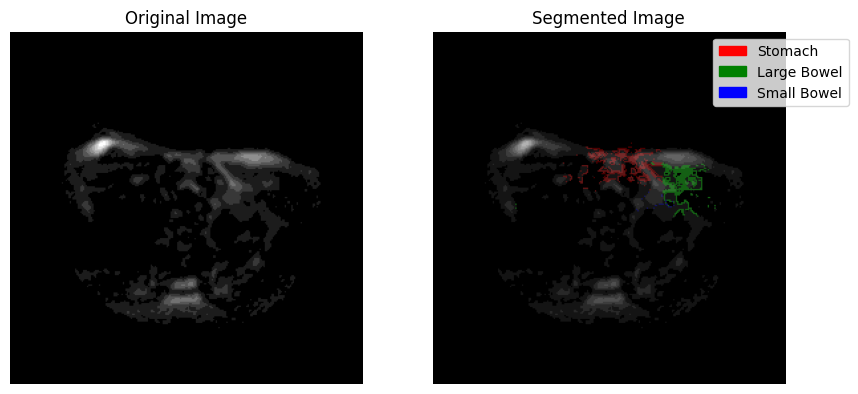

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case123/case123_day20/scans/slice_0001_266_266_1.50_1.50.png...
Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case123/case123_day20/scans/slice_0001_266_266_1.50_1.50.png...
Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case123/case123_day20/scans/slice_0002_266_266_1.50_1.50.png...
Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case123/case123_day20/scans/slice_0002_266_266_1.50_1.50.png...
Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case123/case123_day20/scans/slice_0002_266_266_1.50_1.50.png...
Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case123/case123_day20/scans/slice_0003_266_266_1.50_1.50

In [56]:
count = 0
visualization_limit = 200

print("Predicting and displaying segmentation for new images...")
for index, row in df.iterrows():
    if count >= visualization_limit:
        break

    # Construct full image path
    image_relative_path = os.path.relpath(row['image_path'], '/kaggle/input/uw-madison-gi-tract-image-segmentation/train')
    image_path = os.path.join(images_base_dir, image_relative_path)

    if os.path.exists(image_path):
        predict_and_display(image_path, count, display=(count == 0))
        count += 1

print("Segmentation process completed")

Testing

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case44/case44_day20/scans/slice_0019_266_266_1.50_1.50.png...


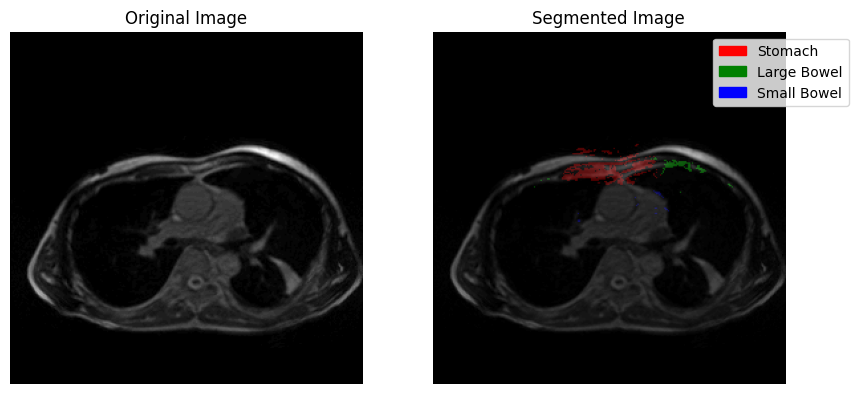

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case130/case130_day22/scans/slice_0092_266_266_1.50_1.50.png...


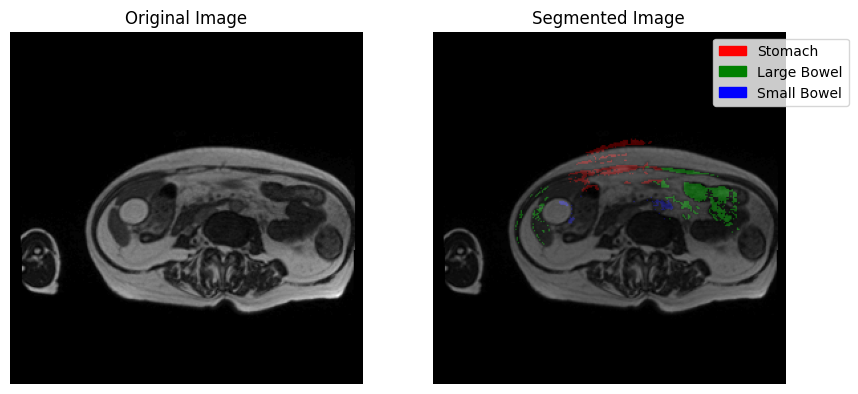

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case114/case114_day15/scans/slice_0087_360_310_1.50_1.50.png...


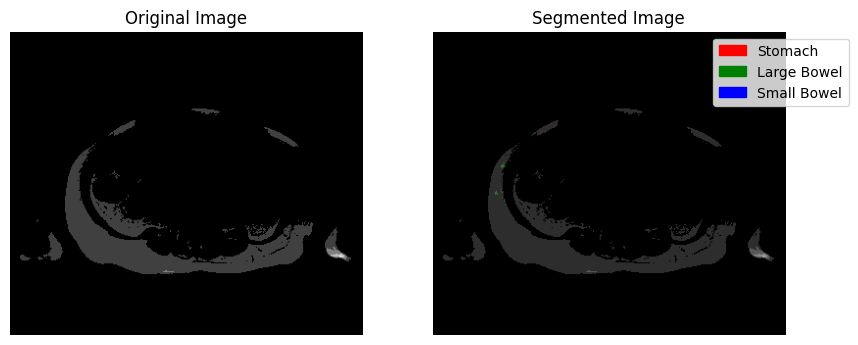

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case65/case65_day28/scans/slice_0019_266_266_1.50_1.50.png...


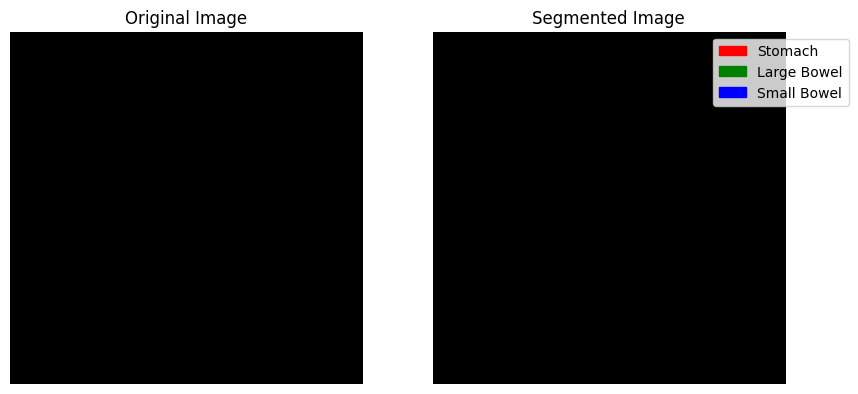

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case129/case129_day27/scans/slice_0128_360_310_1.50_1.50.png...


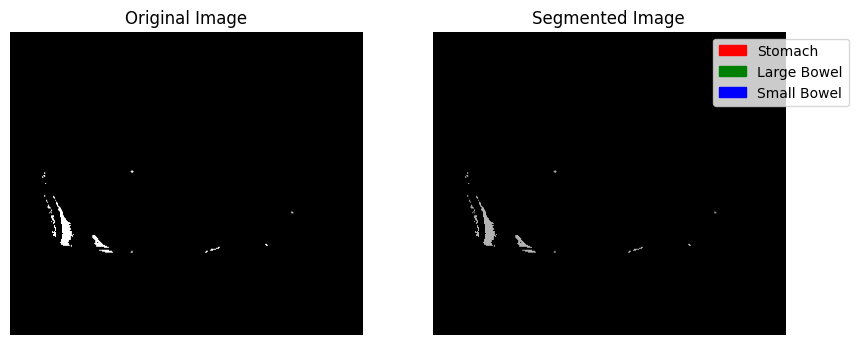

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case77/case77_day20/scans/slice_0074_266_266_1.50_1.50.png...


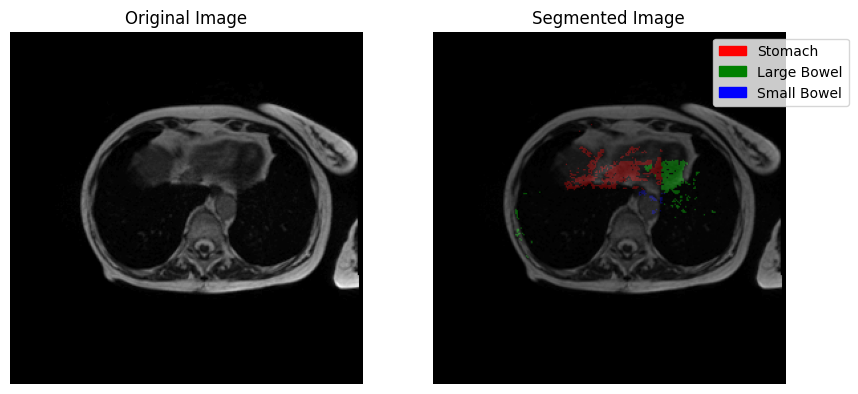

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case65/case65_day0/scans/slice_0072_266_266_1.50_1.50.png...


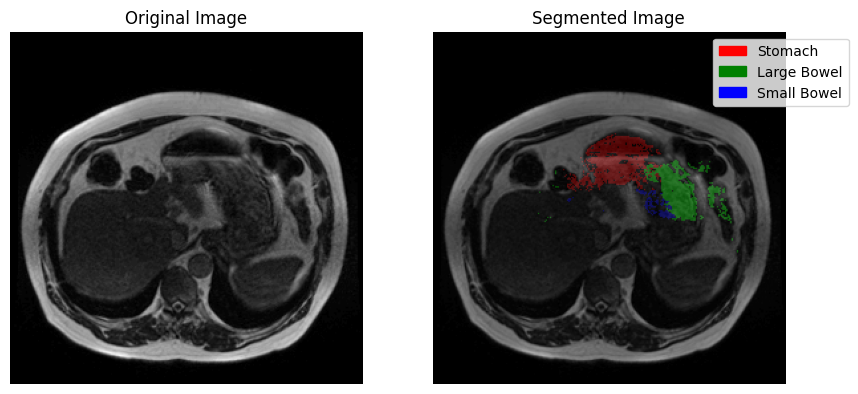

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case139/case139_day0/scans/slice_0104_234_234_1.50_1.50.png...


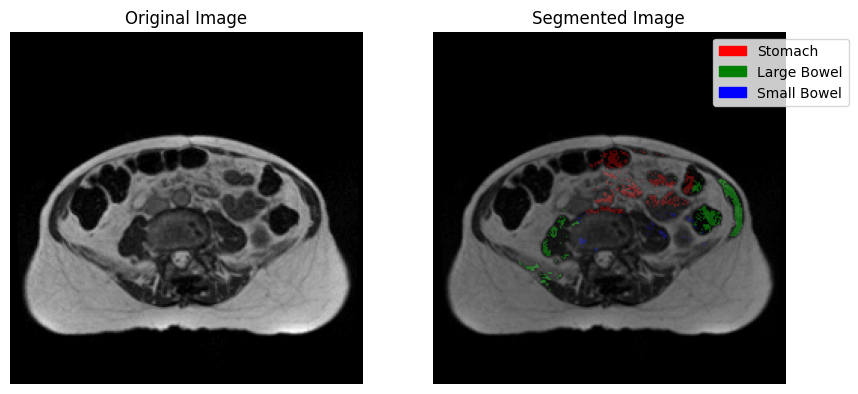

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case139/case139_day0/scans/slice_0063_234_234_1.50_1.50.png...


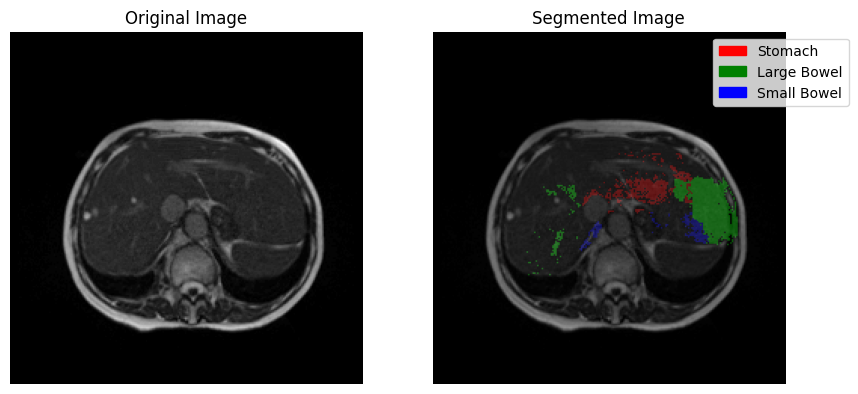

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case115/case115_day0/scans/slice_0088_266_266_1.50_1.50.png...


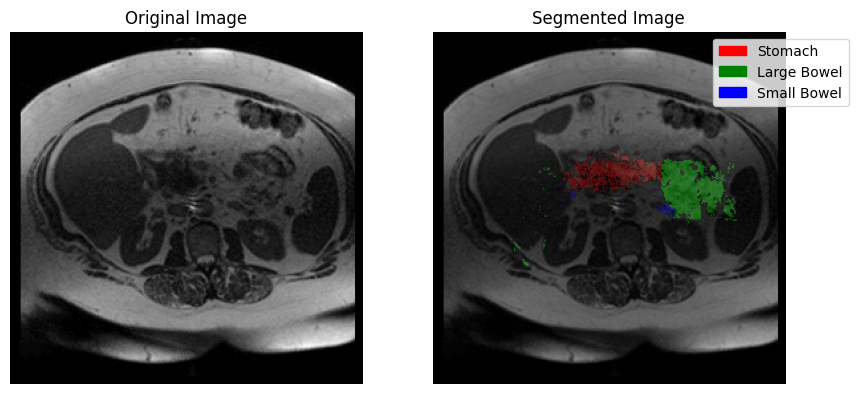

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case142/case142_day0/scans/slice_0130_266_266_1.50_1.50.png...


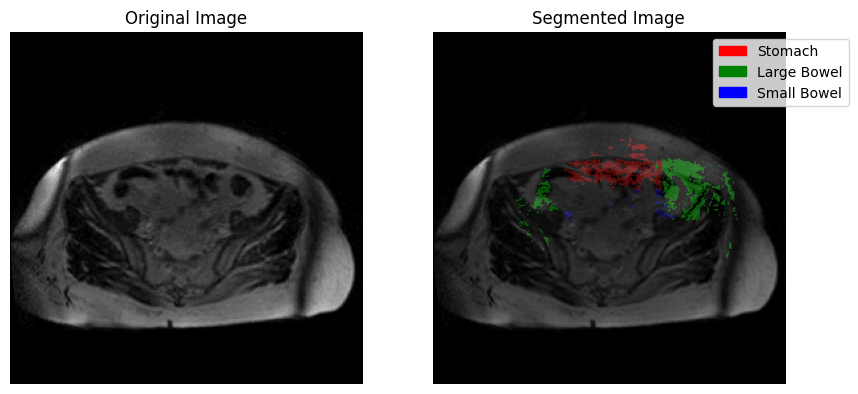

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case145/case145_day0/scans/slice_0034_360_310_1.50_1.50.png...


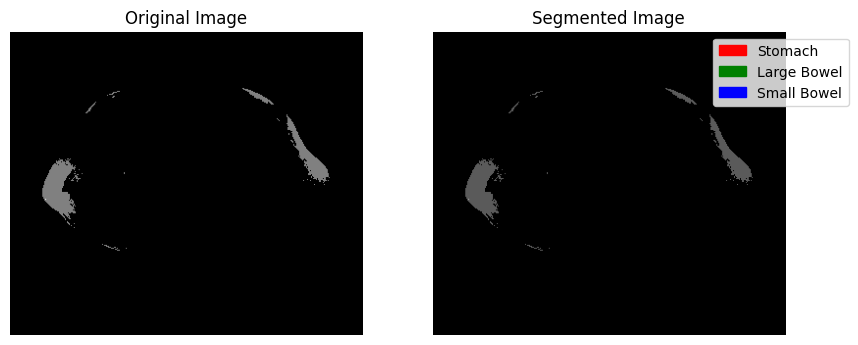

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case66/case66_day34/scans/slice_0047_266_266_1.50_1.50.png...


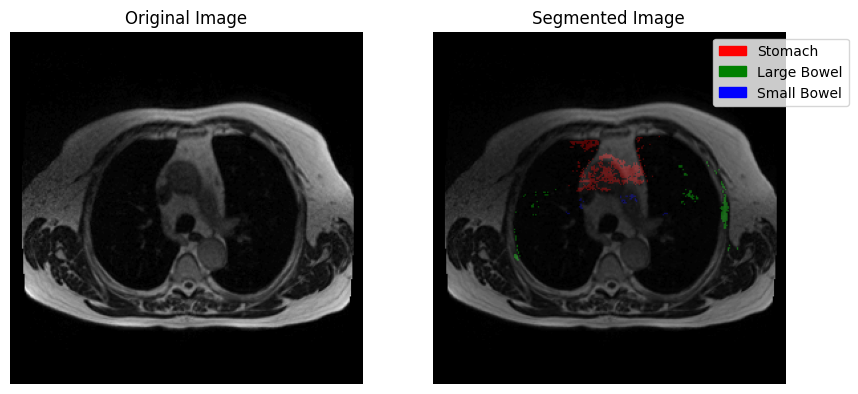

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case15/case15_day20/scans/slice_0087_266_266_1.50_1.50.png...


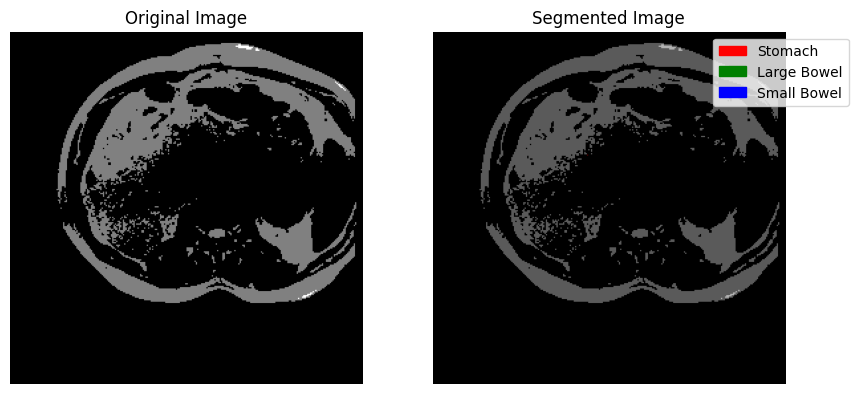

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case65/case65_day25/scans/slice_0142_266_266_1.50_1.50.png...


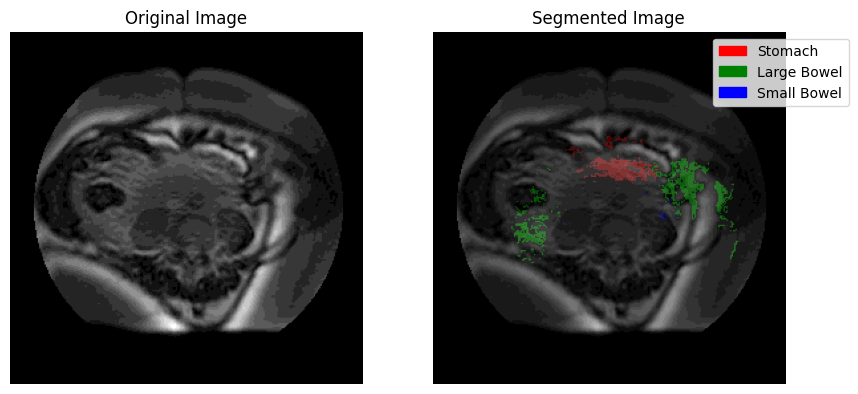

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case102/case102_day0/scans/slice_0117_360_310_1.50_1.50.png...


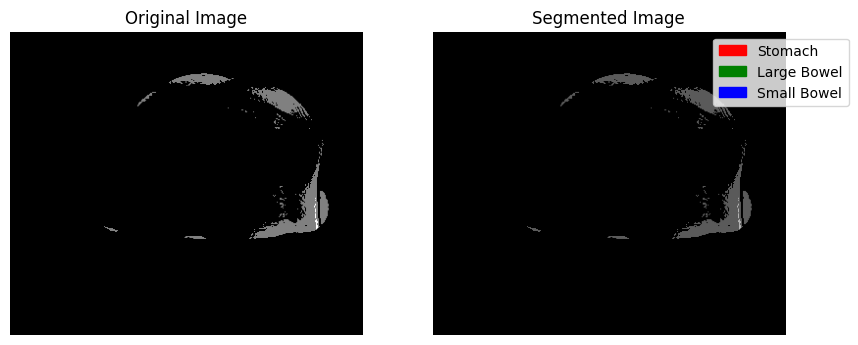

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case88/case88_day0/scans/slice_0129_360_310_1.50_1.50.png...


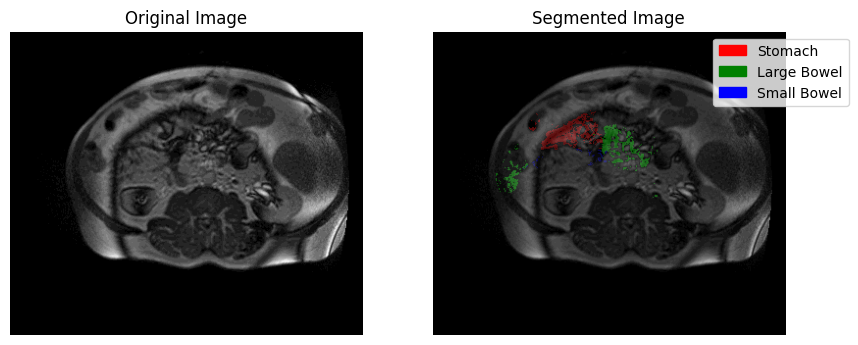

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case133/case133_day23/scans/slice_0107_360_310_1.50_1.50.png...


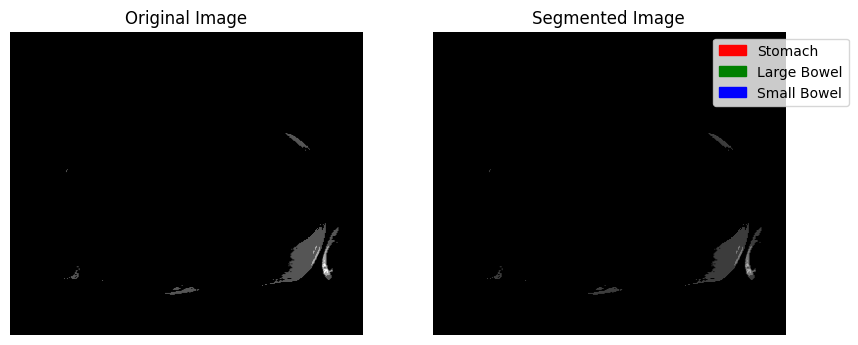

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case114/case114_day15/scans/slice_0032_360_310_1.50_1.50.png...


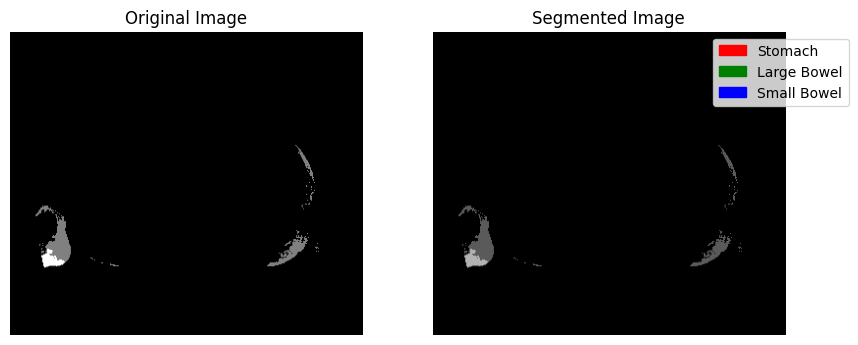

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case114/case114_day15/scans/slice_0044_360_310_1.50_1.50.png...


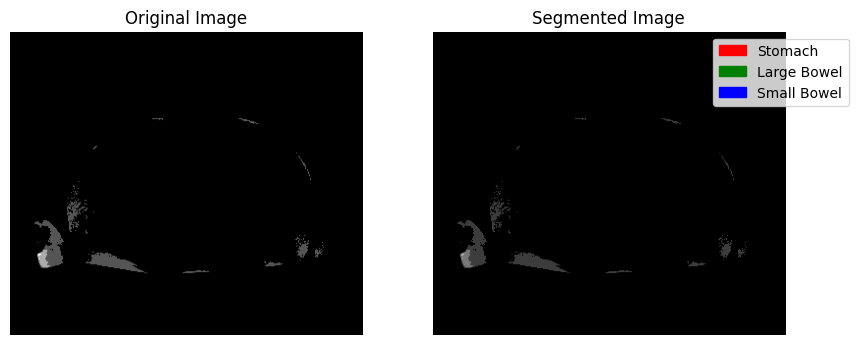

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case142/case142_day0/scans/slice_0002_266_266_1.50_1.50.png...


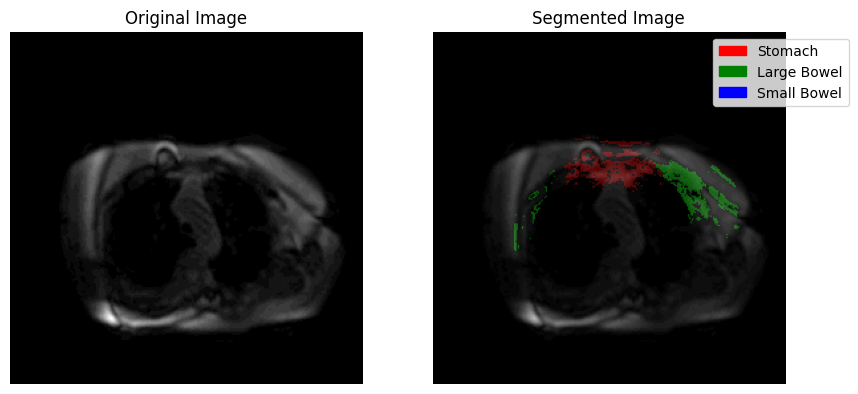

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case118/case118_day16/scans/slice_0058_266_266_1.50_1.50.png...


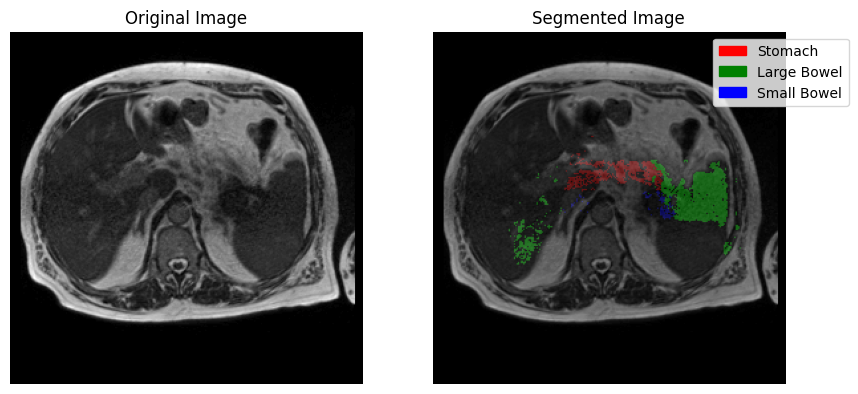

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case66/case66_day34/scans/slice_0097_266_266_1.50_1.50.png...


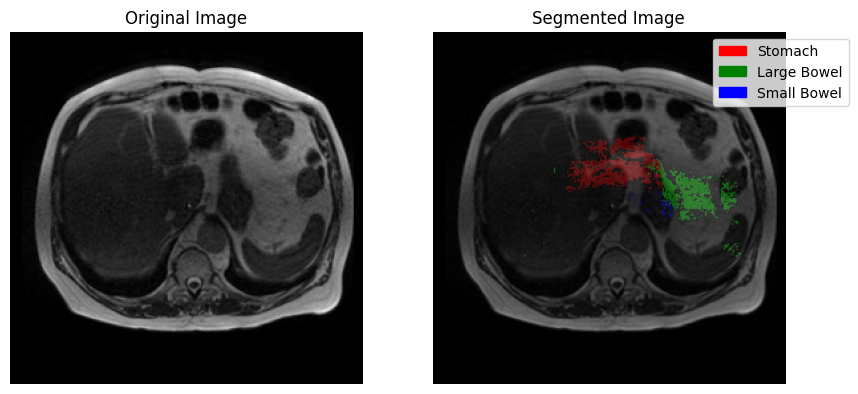

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case102/case102_day0/scans/slice_0119_360_310_1.50_1.50.png...


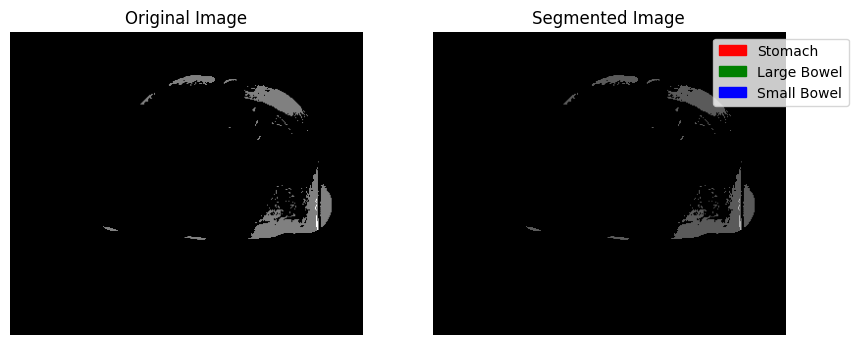

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case123/case123_day0/scans/slice_0130_266_266_1.50_1.50.png...


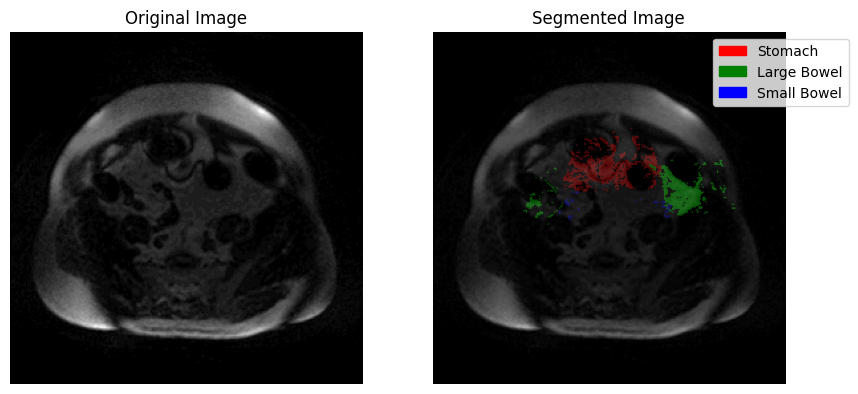

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case130/case130_day22/scans/slice_0028_266_266_1.50_1.50.png...


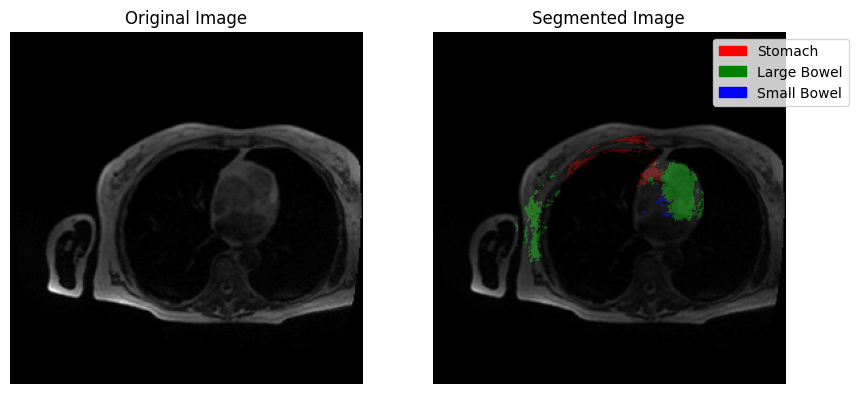

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case102/case102_day0/scans/slice_0088_360_310_1.50_1.50.png...


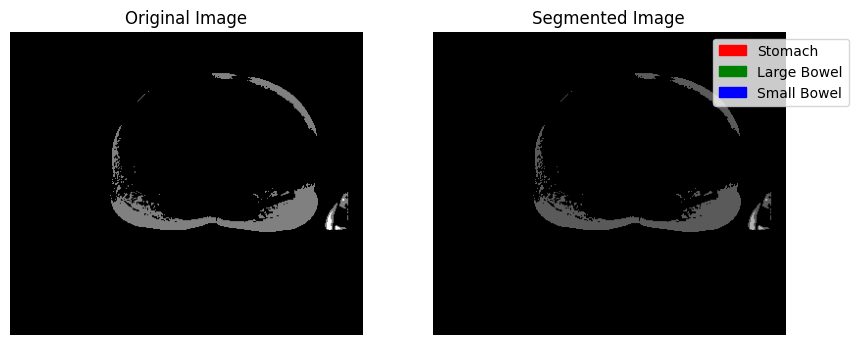

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case123/case123_day20/scans/slice_0105_266_266_1.50_1.50.png...


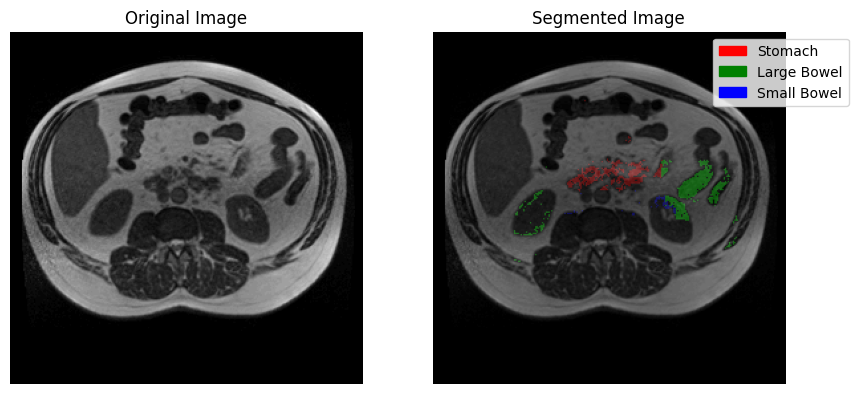

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case139/case139_day18/scans/slice_0095_266_266_1.50_1.50.png...


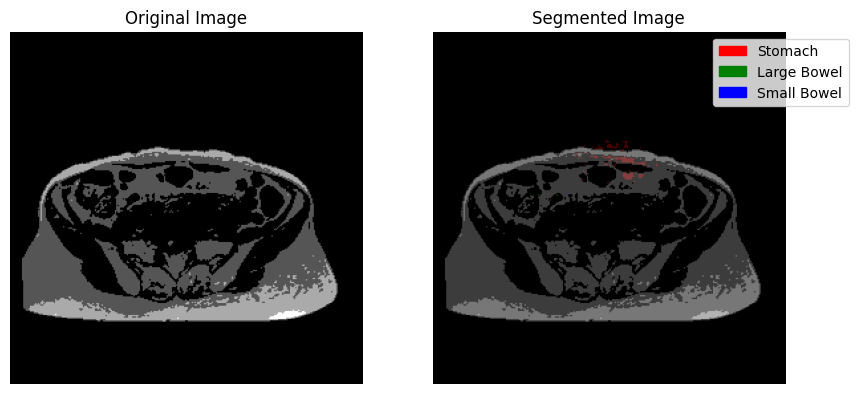

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case77/case77_day18/scans/slice_0070_266_266_1.50_1.50.png...


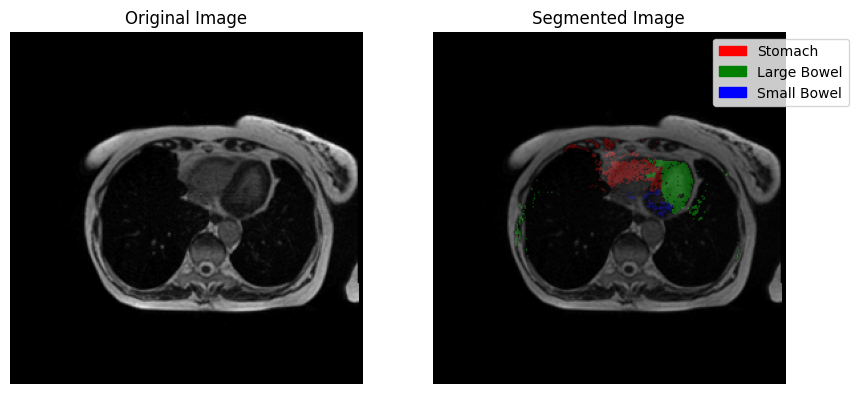

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case58/case58_day0/scans/slice_0105_266_266_1.50_1.50.png...


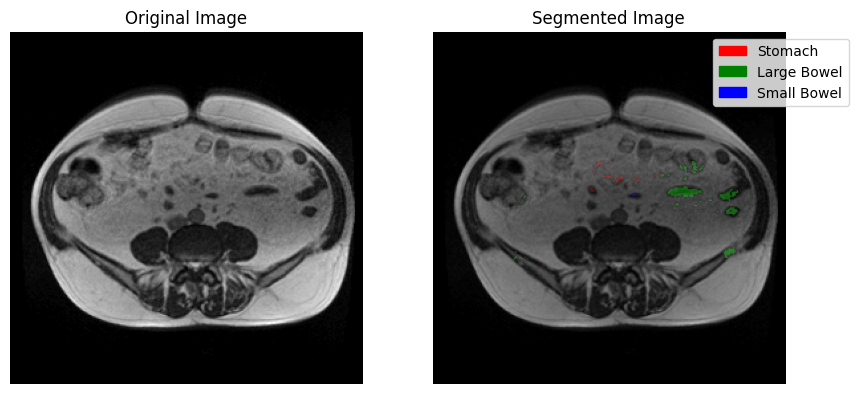

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case118/case118_day16/scans/slice_0068_266_266_1.50_1.50.png...


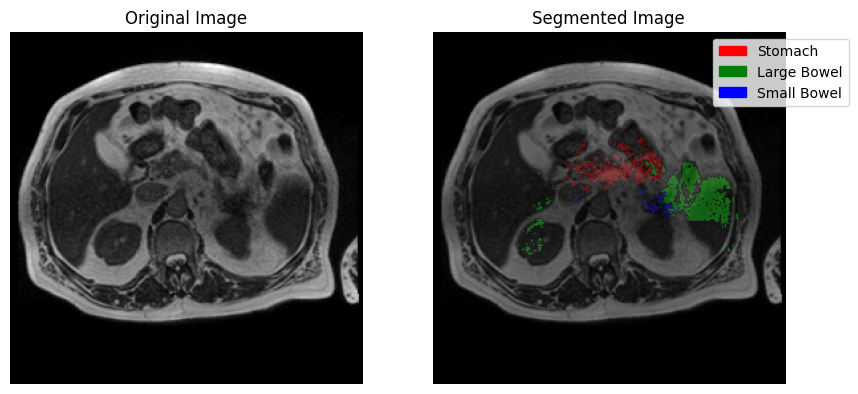

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case129/case129_day24/scans/slice_0135_360_310_1.50_1.50.png...


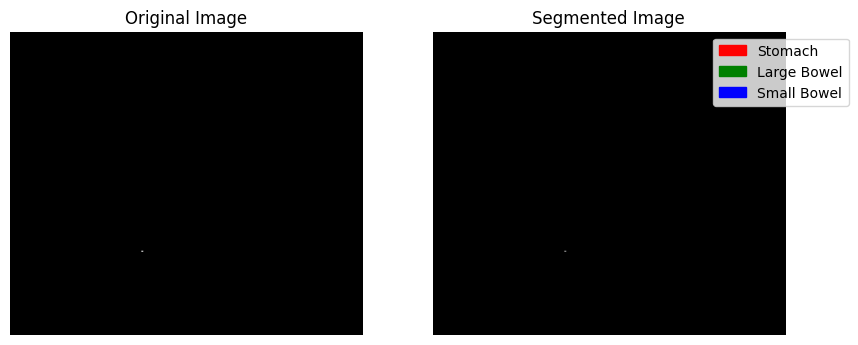

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case130/case130_day22/scans/slice_0045_266_266_1.50_1.50.png...


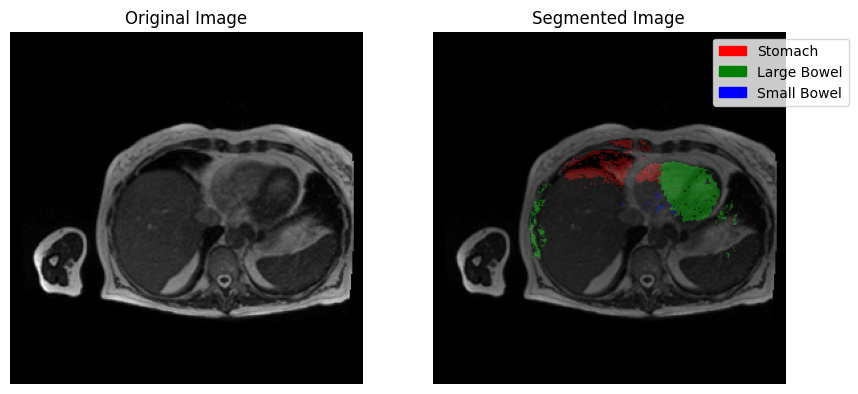

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case118/case118_day0/scans/slice_0070_276_276_1.63_1.63.png...


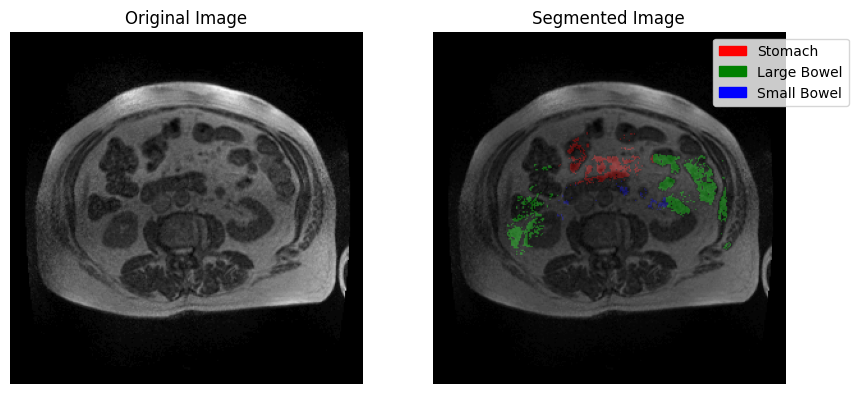

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case118/case118_day0/scans/slice_0028_276_276_1.63_1.63.png...


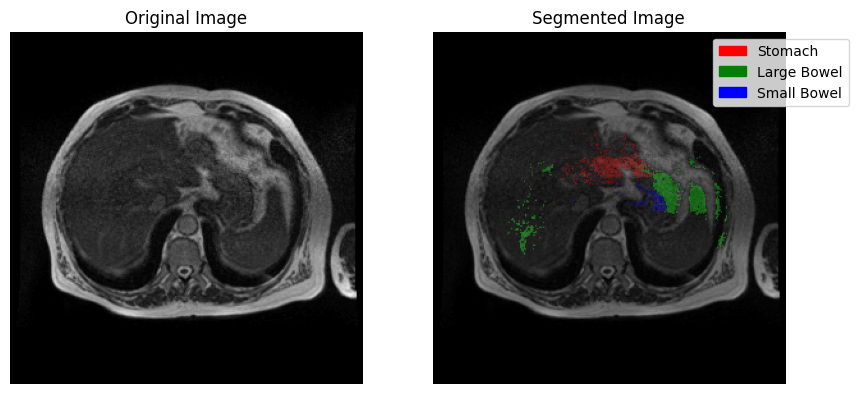

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case118/case118_day16/scans/slice_0113_266_266_1.50_1.50.png...


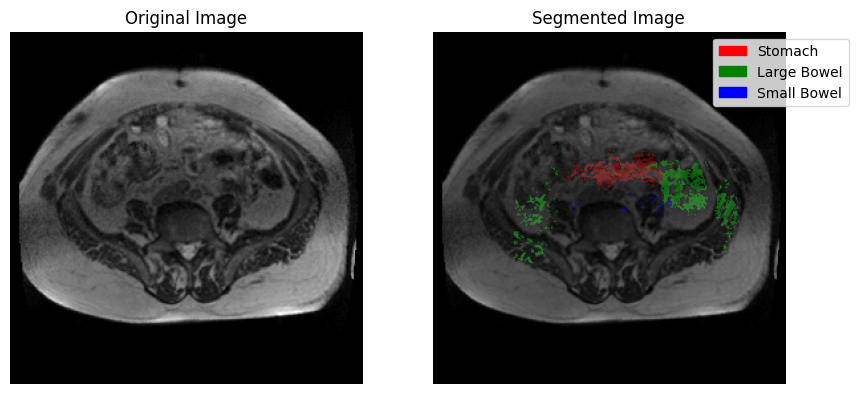

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case118/case118_day0/scans/slice_0002_276_276_1.63_1.63.png...


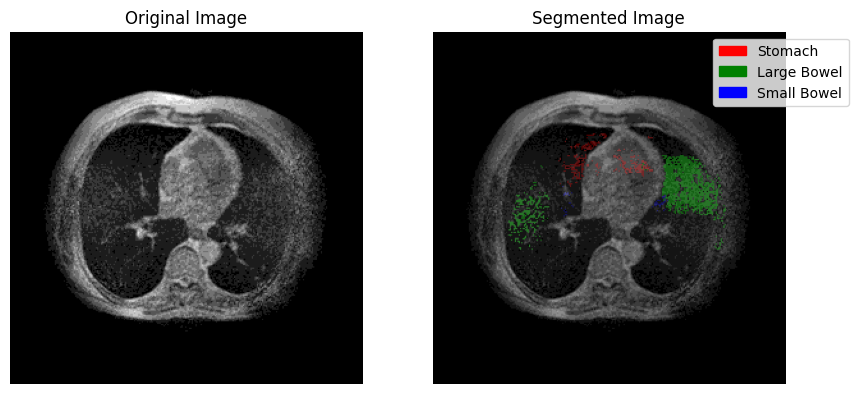

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case110/case110_day16/scans/slice_0107_360_310_1.50_1.50.png...


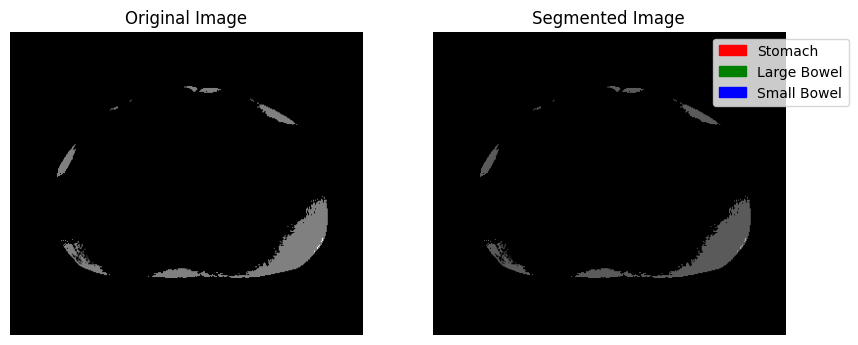

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case42/case42_day19/scans/slice_0096_266_266_1.50_1.50.png...


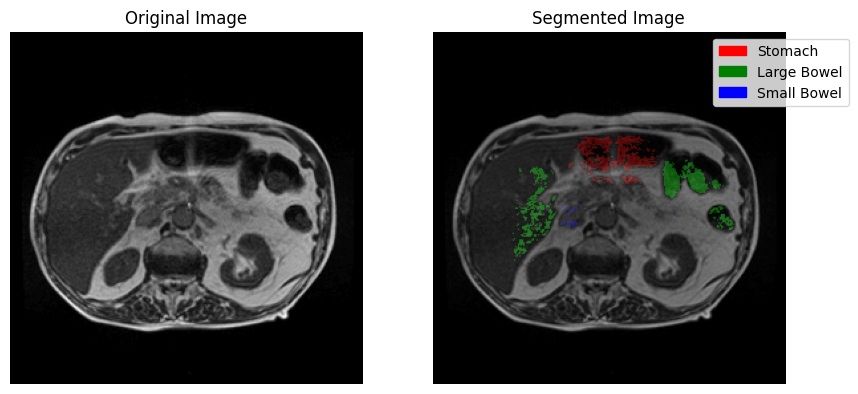

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case129/case129_day27/scans/slice_0116_360_310_1.50_1.50.png...


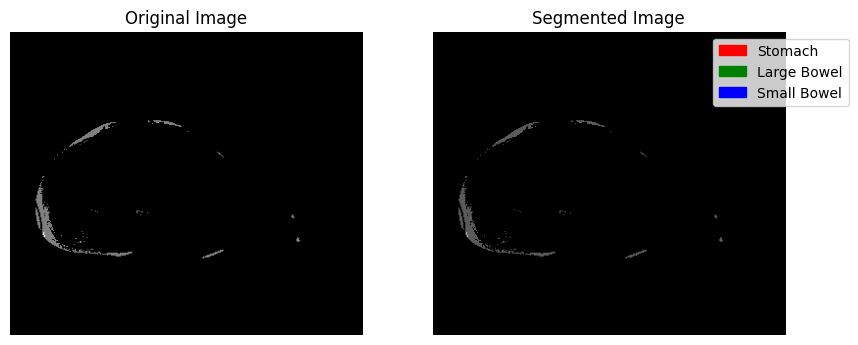

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case63/case63_day26/scans/slice_0037_266_266_1.50_1.50.png...


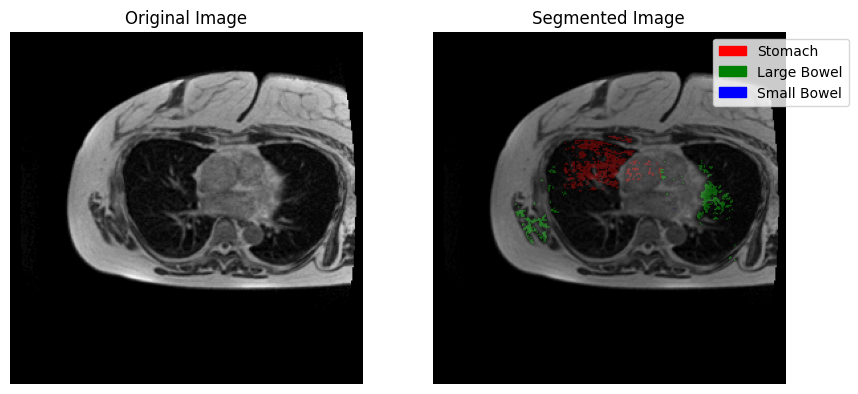

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case110/case110_day16/scans/slice_0117_360_310_1.50_1.50.png...


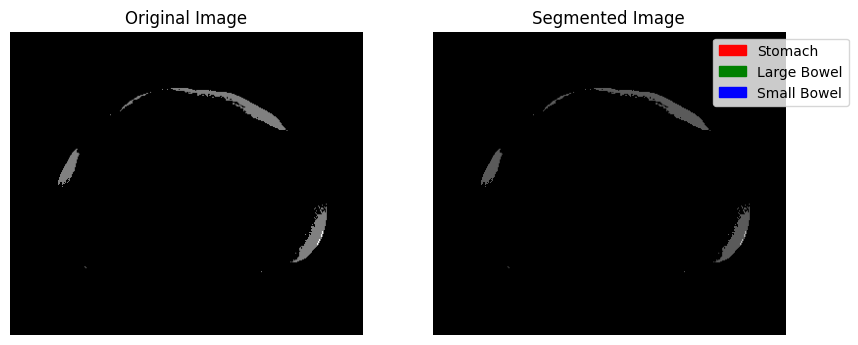

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case91/case91_day0/scans/slice_0101_266_266_1.50_1.50.png...


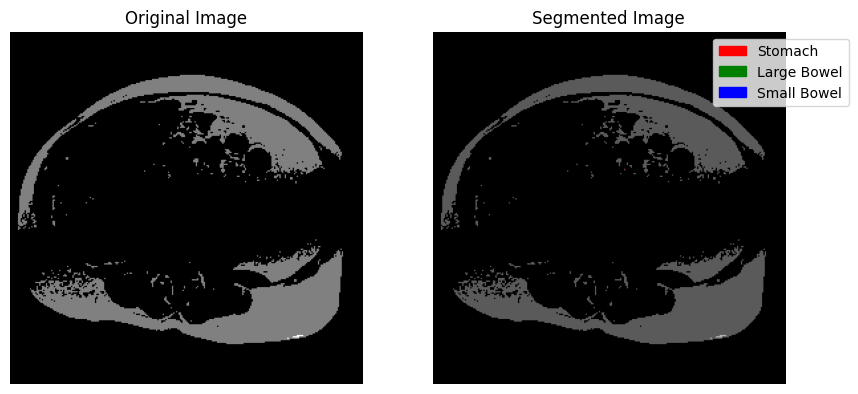

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case142/case142_day14/scans/slice_0068_266_266_1.50_1.50.png...


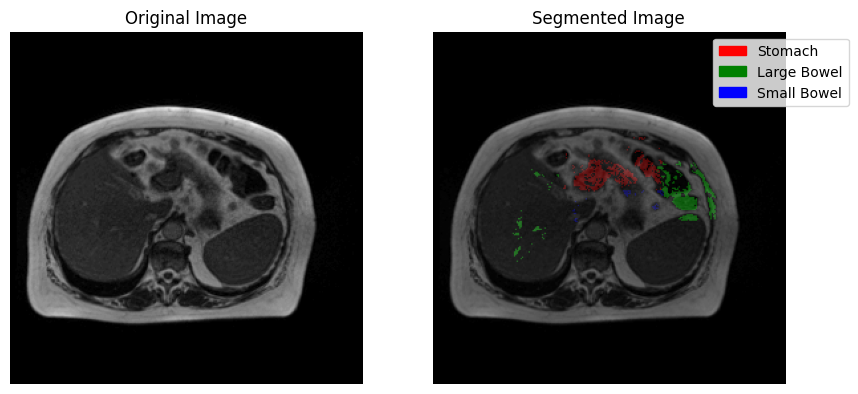

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case42/case42_day17/scans/slice_0074_266_266_1.50_1.50.png...


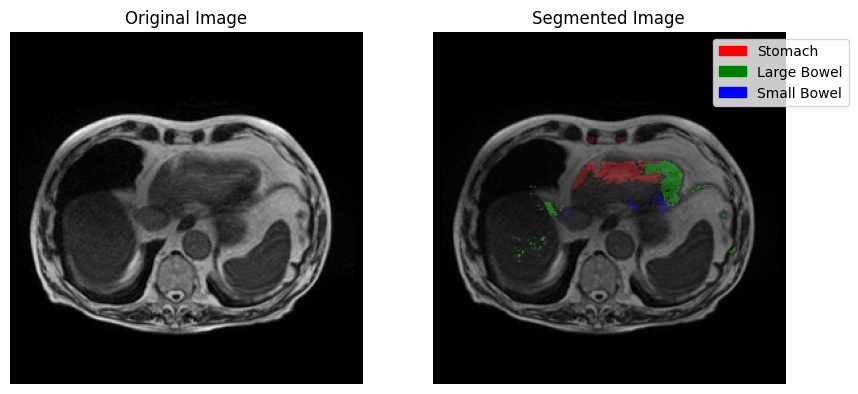

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case53/case53_day0/scans/slice_0034_266_266_1.50_1.50.png...


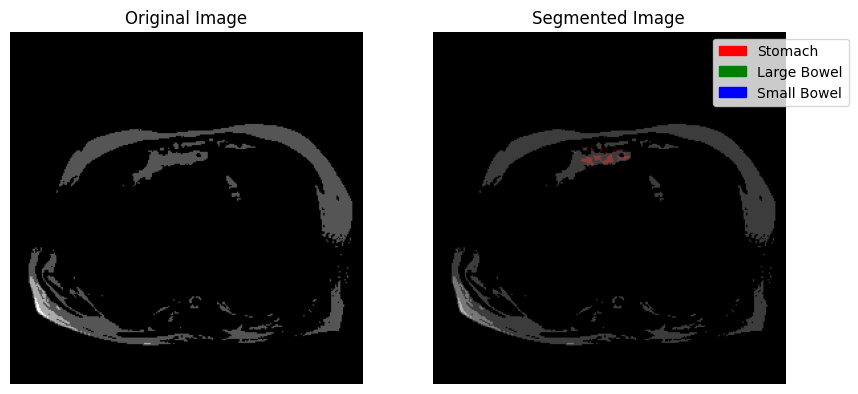

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case44/case44_day20/scans/slice_0067_266_266_1.50_1.50.png...


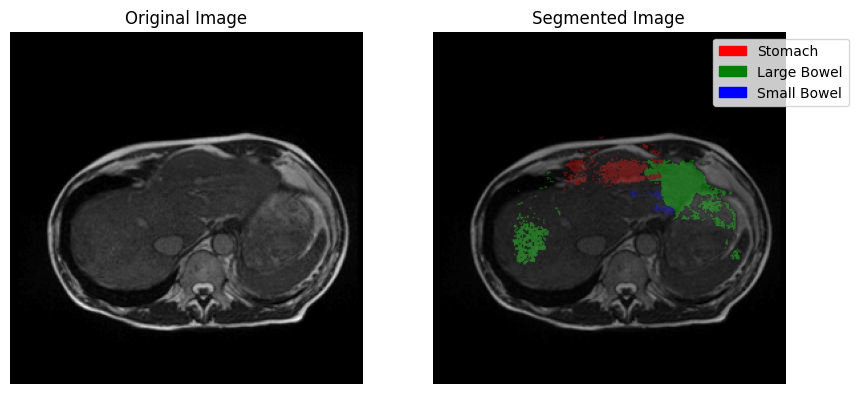

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case58/case58_day0/scans/slice_0055_266_266_1.50_1.50.png...


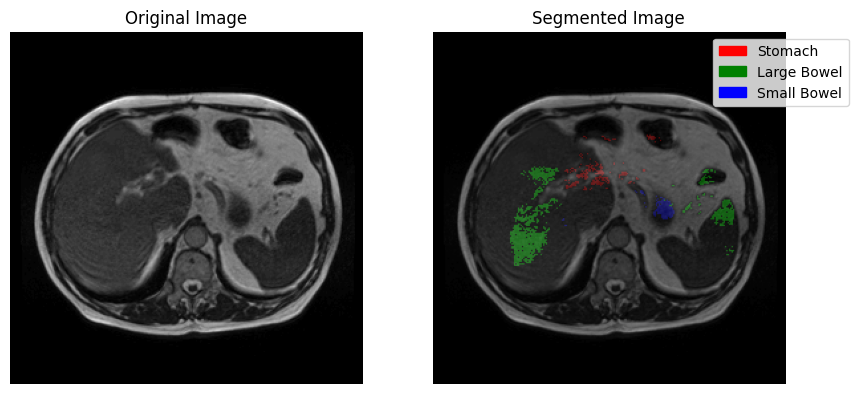

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case15/case15_day20/scans/slice_0031_266_266_1.50_1.50.png...


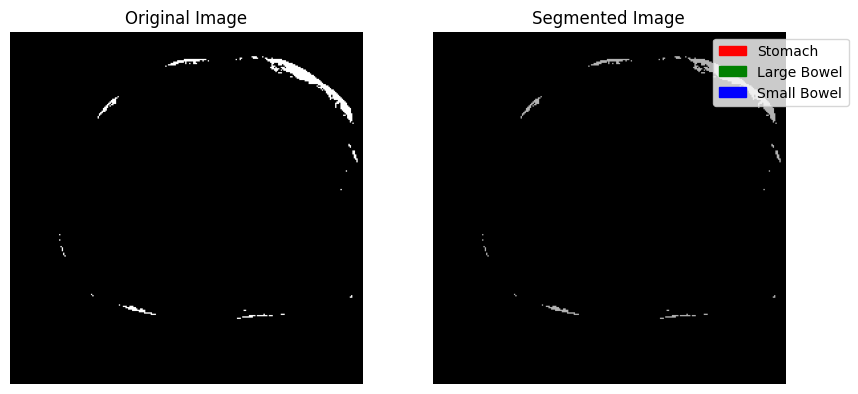

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case66/case66_day34/scans/slice_0112_266_266_1.50_1.50.png...


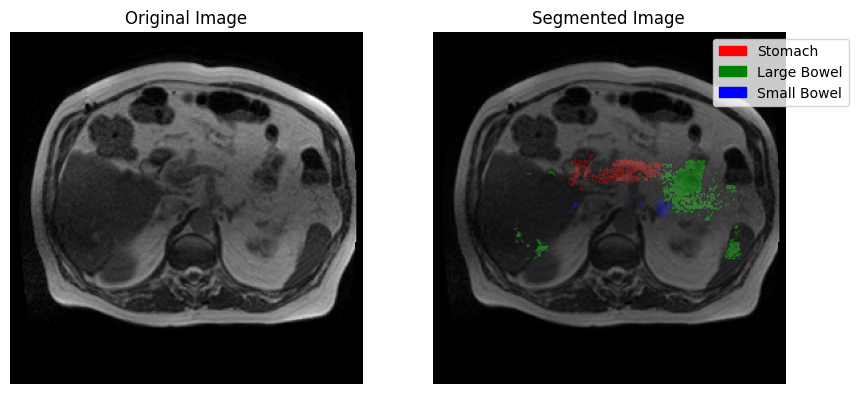

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case129/case129_day22/scans/slice_0076_360_310_1.50_1.50.png...


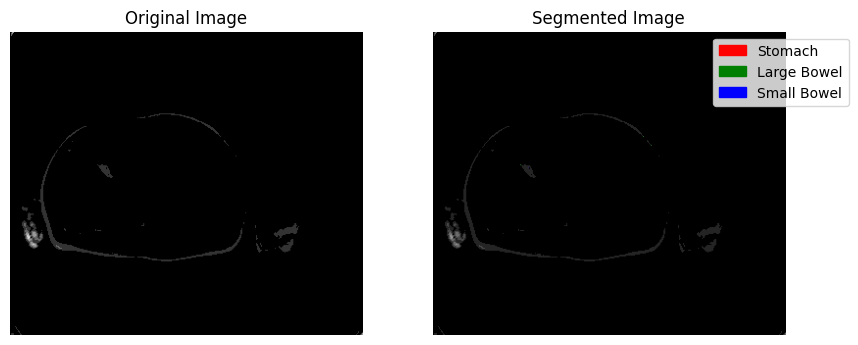

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case63/case63_day22/scans/slice_0121_266_266_1.50_1.50.png...


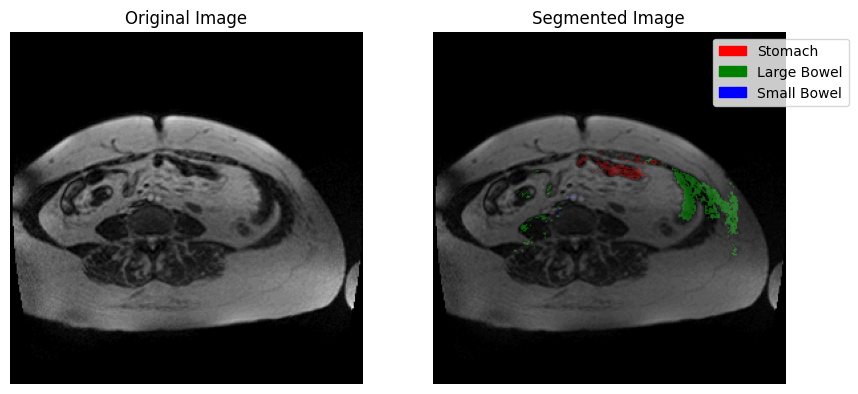

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case110/case110_day12/scans/slice_0096_360_310_1.50_1.50.png...


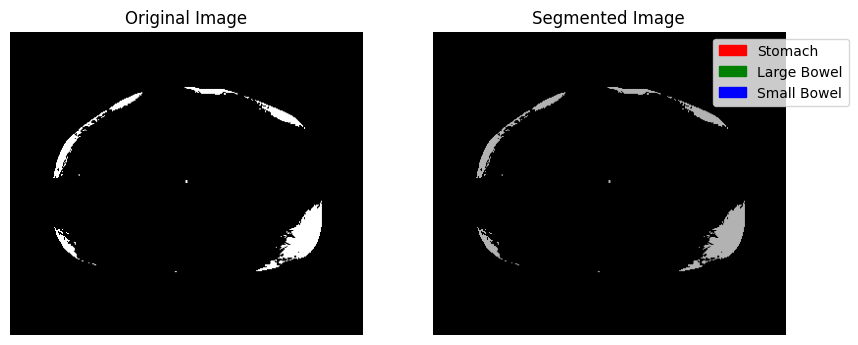

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case77/case77_day18/scans/slice_0139_266_266_1.50_1.50.png...


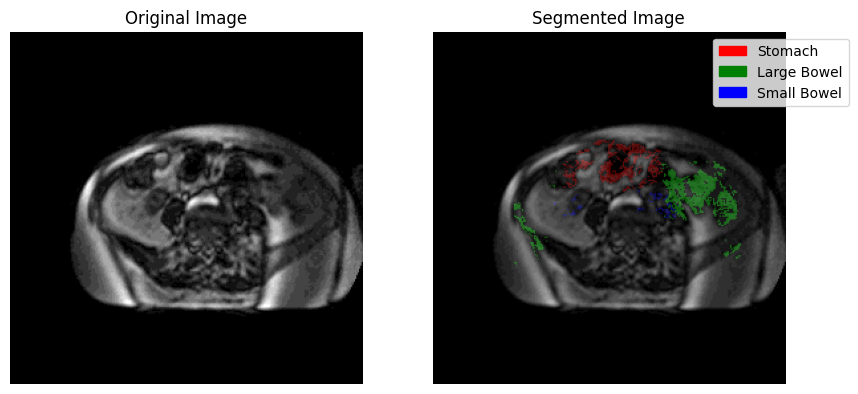

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case65/case65_day25/scans/slice_0080_266_266_1.50_1.50.png...


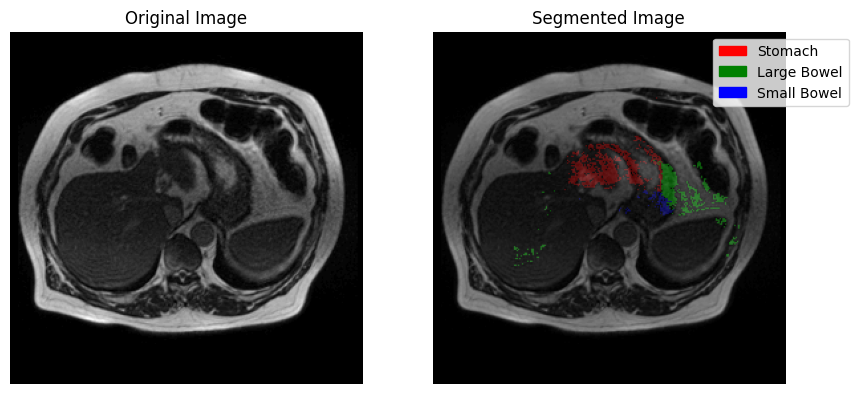

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case114/case114_day17/scans/slice_0087_360_310_1.50_1.50.png...


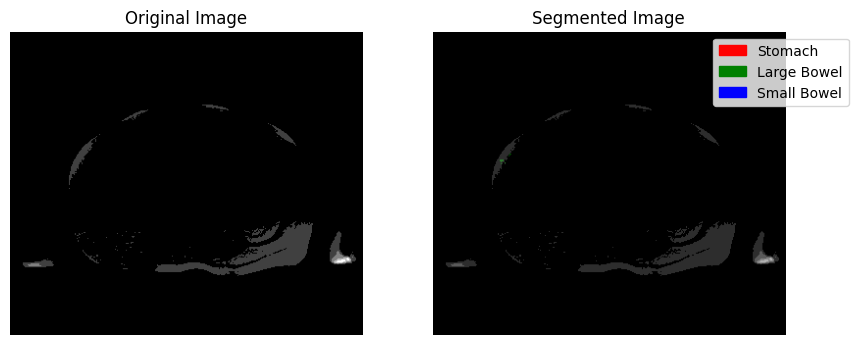

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case110/case110_day16/scans/slice_0078_360_310_1.50_1.50.png...


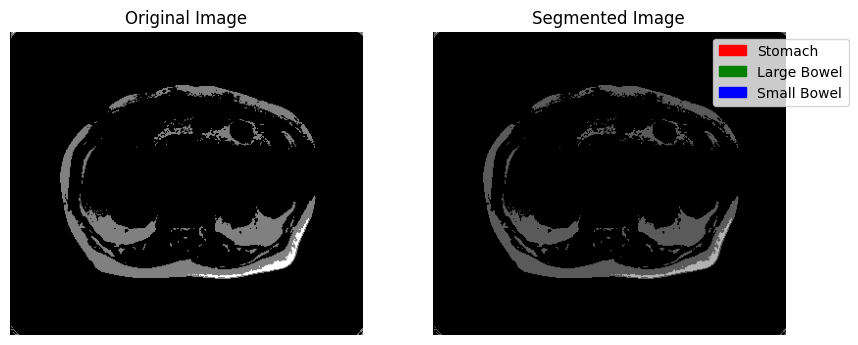

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case133/case133_day0/scans/slice_0080_360_310_1.50_1.50.png...


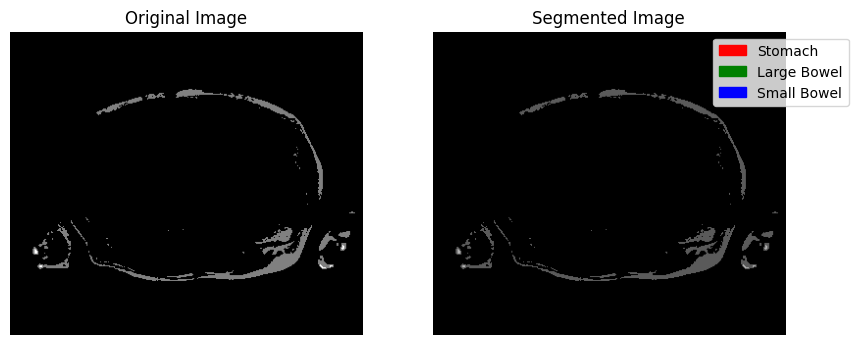

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case63/case63_day18/scans/slice_0064_266_266_1.50_1.50.png...


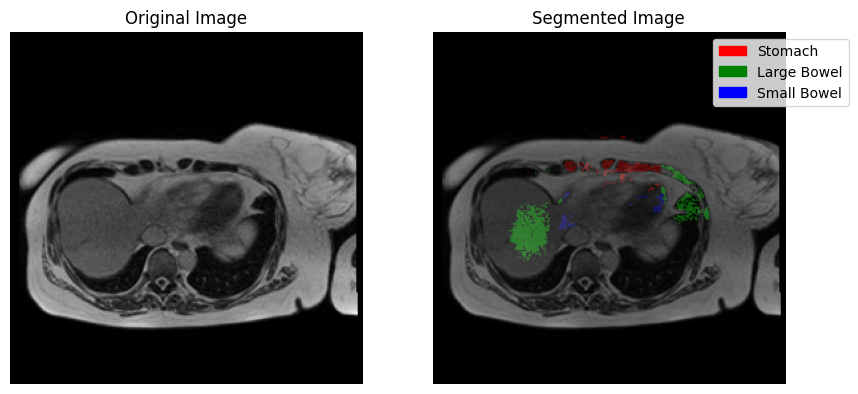

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case129/case129_day0/scans/slice_0101_360_310_1.50_1.50.png...


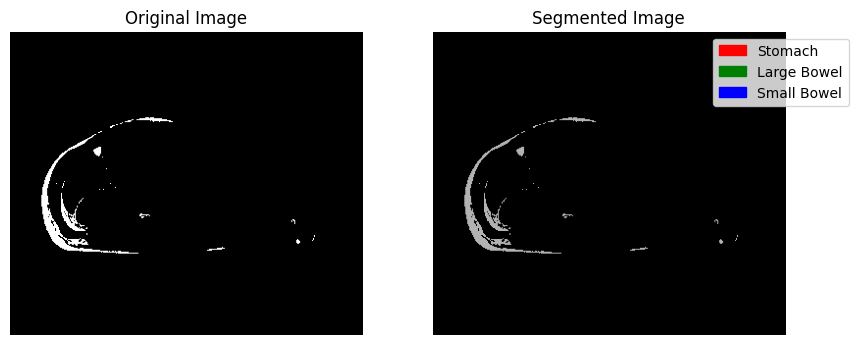

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case15/case15_day20/scans/slice_0054_266_266_1.50_1.50.png...


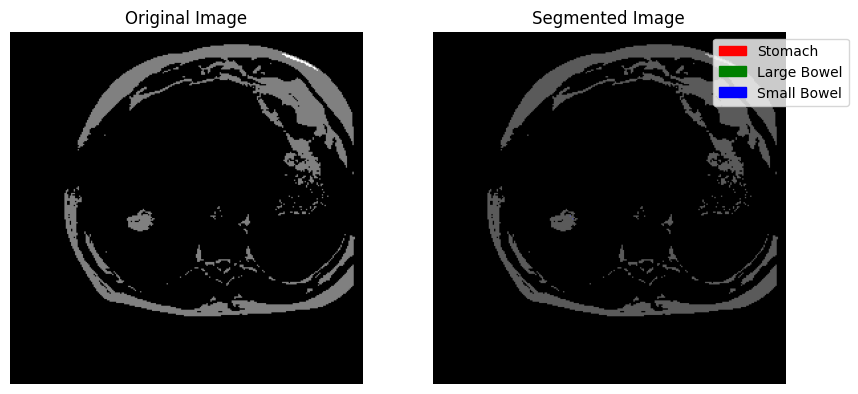

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case63/case63_day18/scans/slice_0110_266_266_1.50_1.50.png...


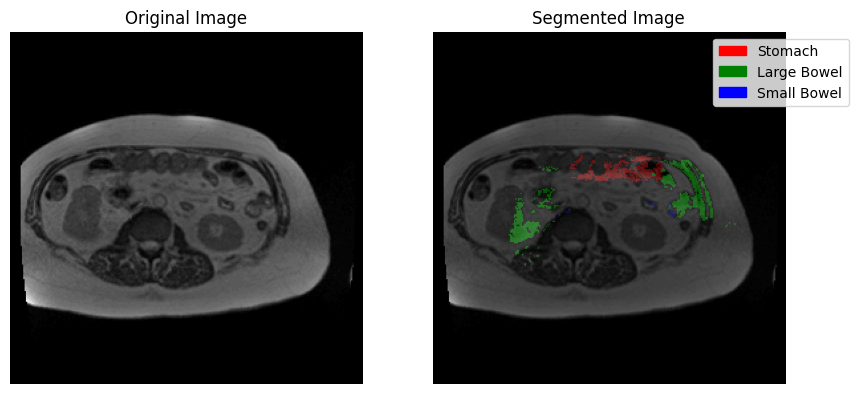

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case44/case44_day0/scans/slice_0097_266_266_1.50_1.50.png...


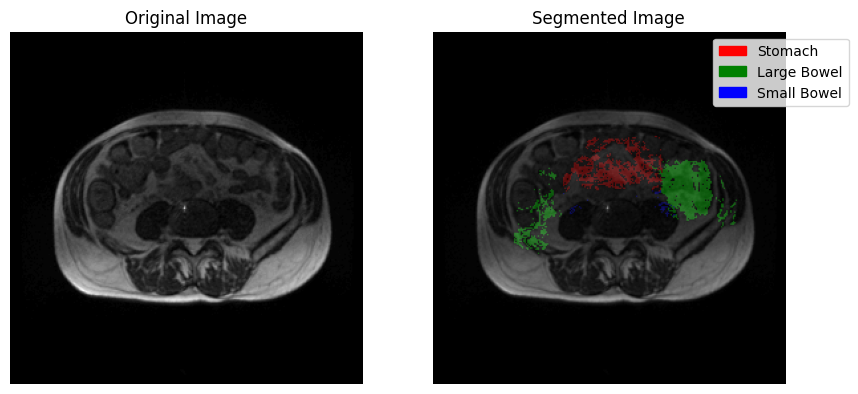

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case63/case63_day18/scans/slice_0066_266_266_1.50_1.50.png...


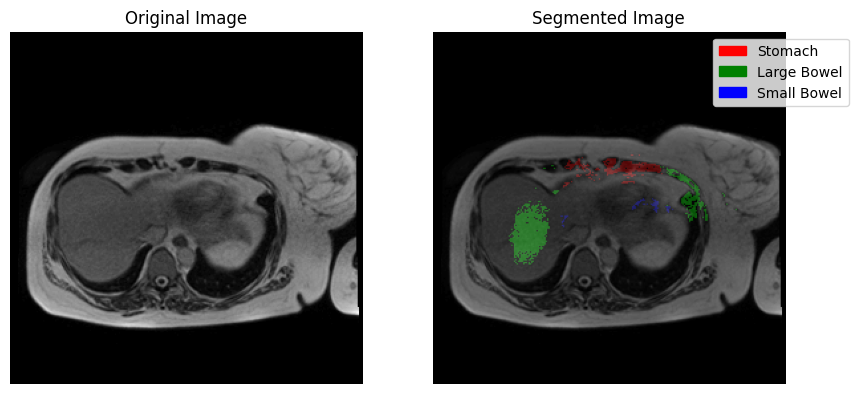

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case123/case123_day0/scans/slice_0063_266_266_1.50_1.50.png...


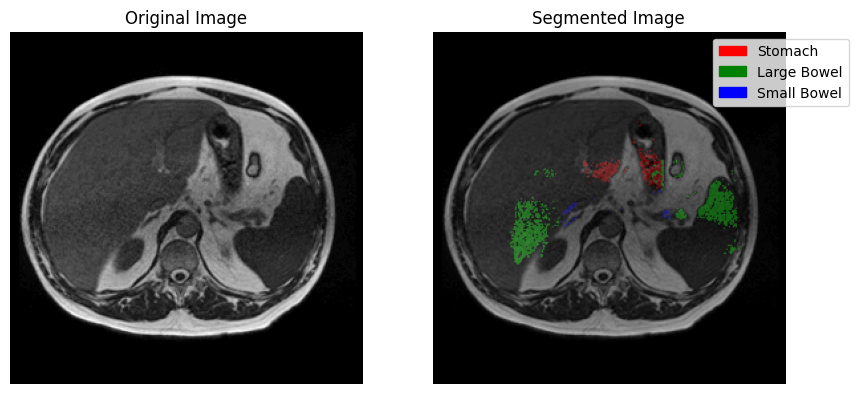

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case15/case15_day0/scans/slice_0021_266_266_1.50_1.50.png...


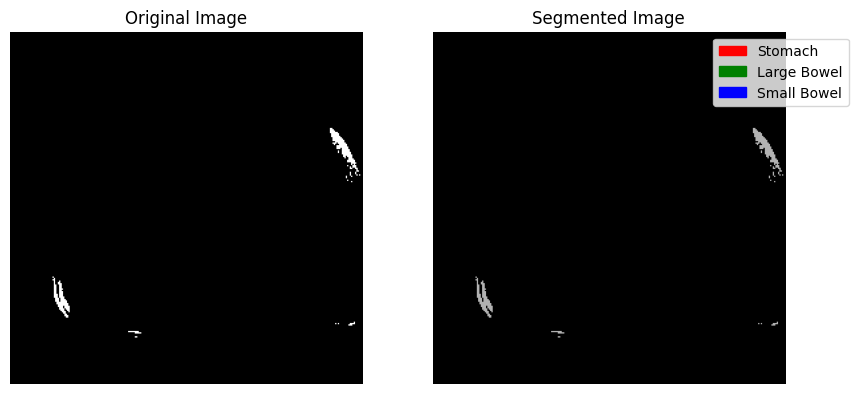

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case44/case44_day0/scans/slice_0040_266_266_1.50_1.50.png...


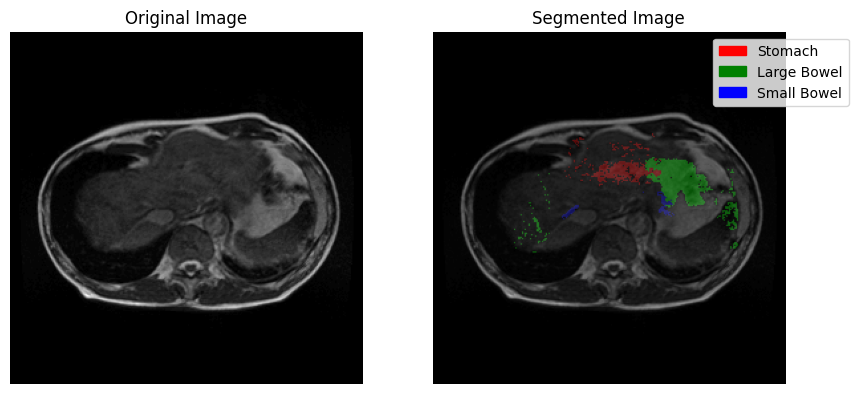

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case88/case88_day38/scans/slice_0070_360_310_1.50_1.50.png...


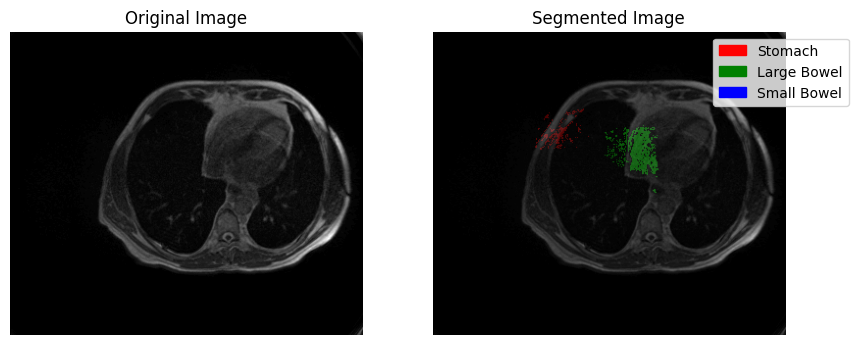

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case133/case133_day23/scans/slice_0061_360_310_1.50_1.50.png...


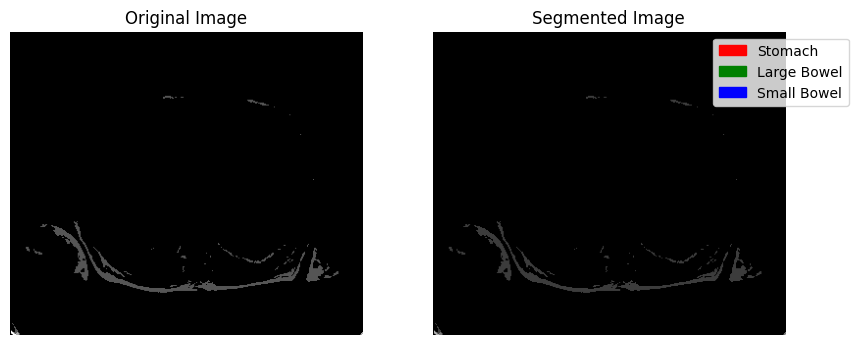

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case65/case65_day25/scans/slice_0084_266_266_1.50_1.50.png...


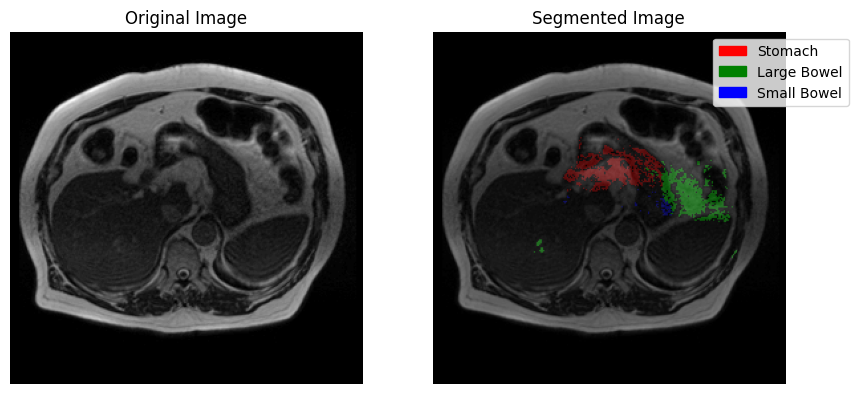

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case110/case110_day16/scans/slice_0144_360_310_1.50_1.50.png...


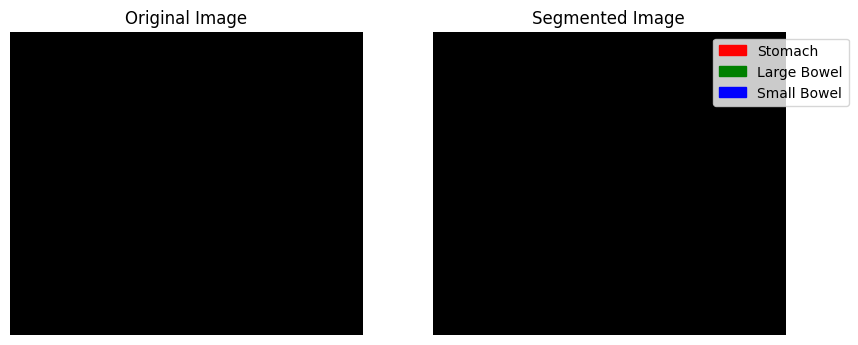

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case102/case102_day0/scans/slice_0091_360_310_1.50_1.50.png...


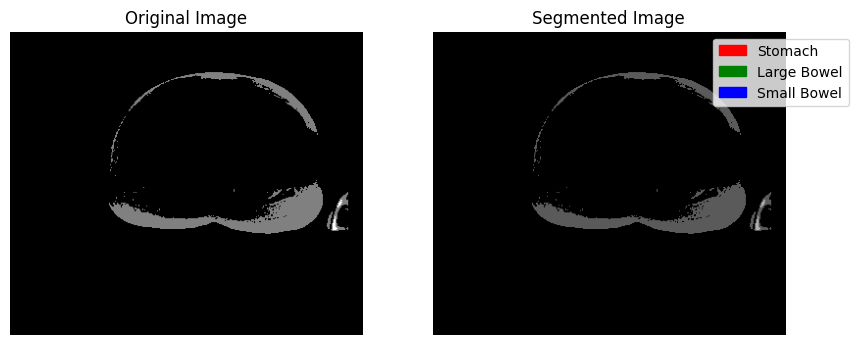

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case129/case129_day0/scans/slice_0003_360_310_1.50_1.50.png...


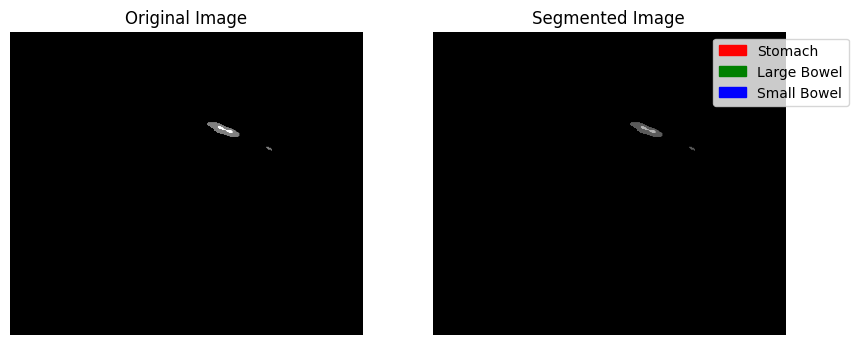

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case123/case123_day20/scans/slice_0019_266_266_1.50_1.50.png...


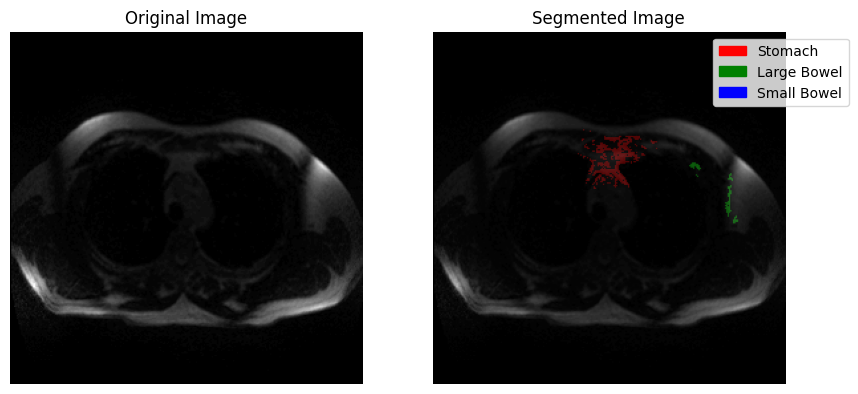

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case53/case53_day0/scans/slice_0039_266_266_1.50_1.50.png...


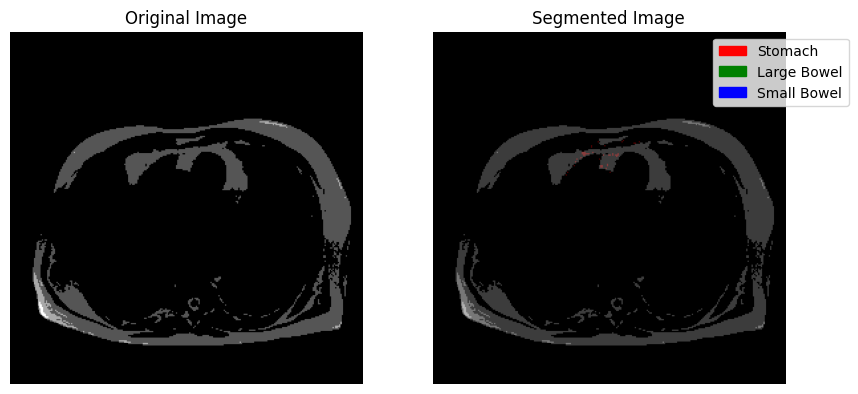

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case130/case130_day22/scans/slice_0072_266_266_1.50_1.50.png...


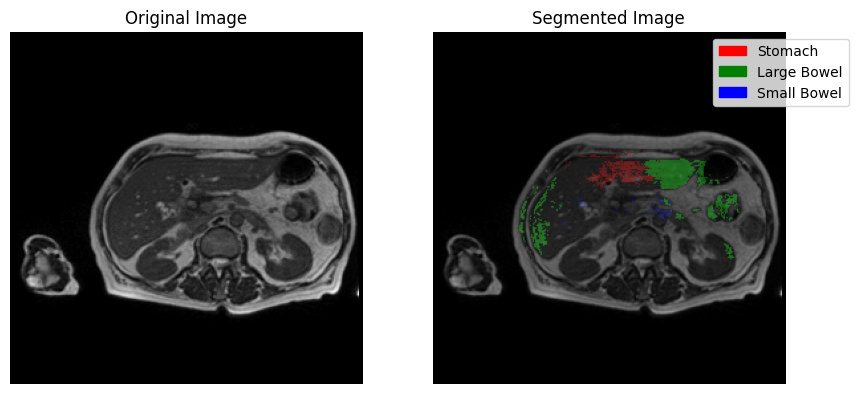

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case145/case145_day0/scans/slice_0081_360_310_1.50_1.50.png...


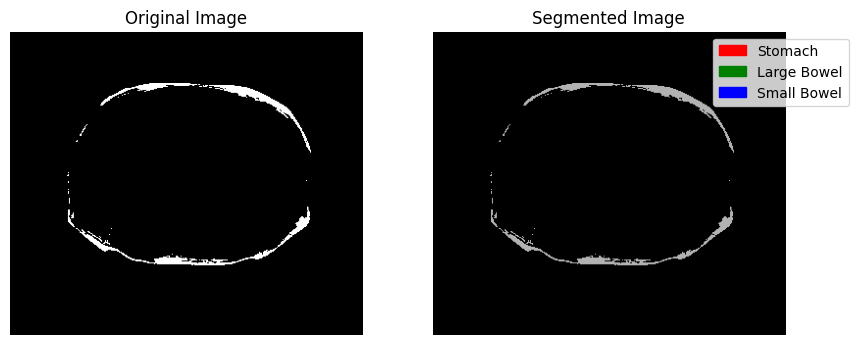

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case65/case65_day0/scans/slice_0139_266_266_1.50_1.50.png...


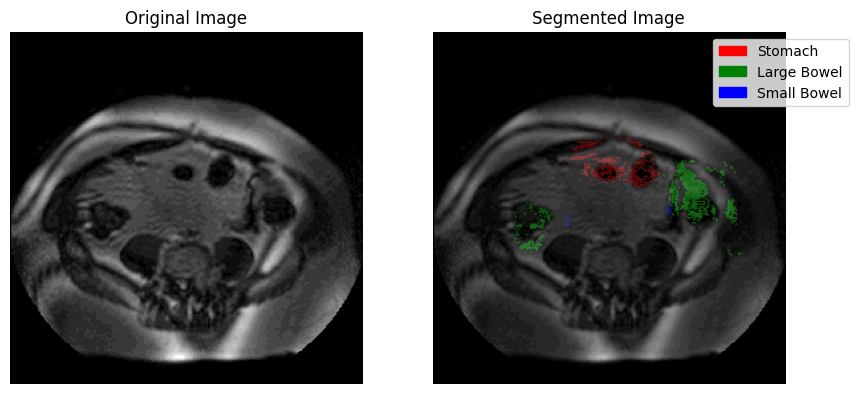

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case122/case122_day25/scans/slice_0112_266_266_1.50_1.50.png...


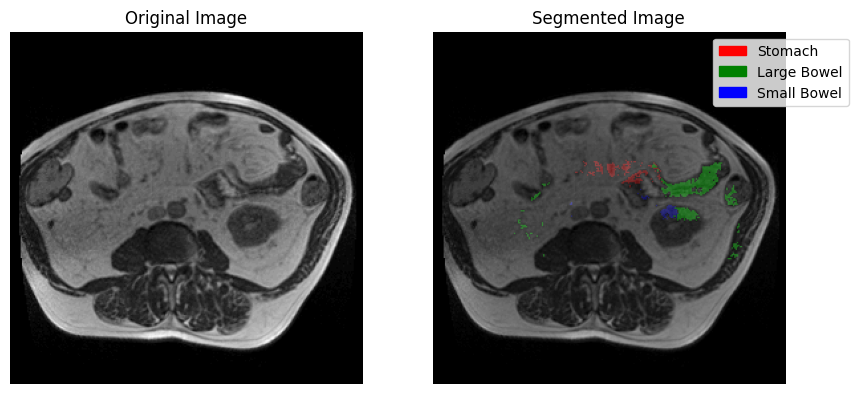

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case122/case122_day24/scans/slice_0132_266_266_1.50_1.50.png...


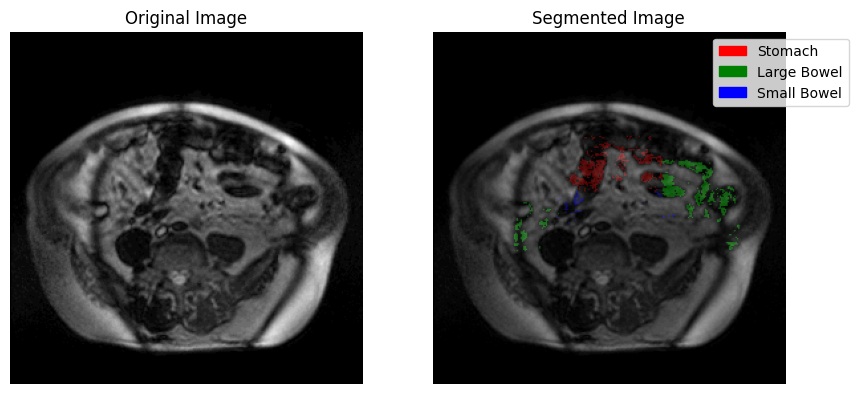

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case142/case142_day16/scans/slice_0104_266_266_1.50_1.50.png...


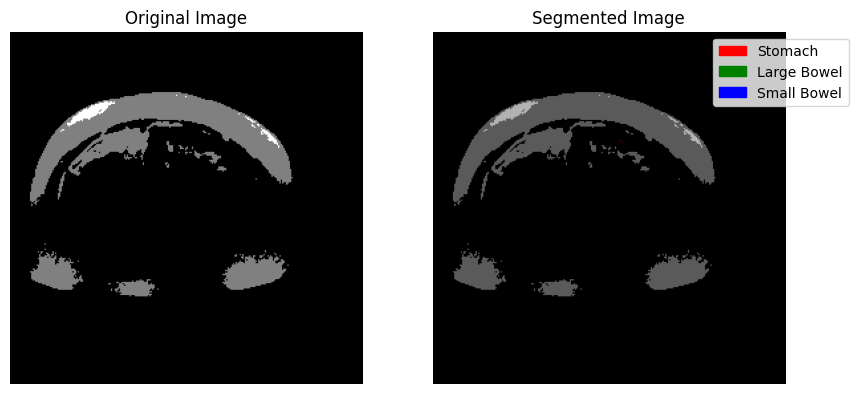

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case65/case65_day25/scans/slice_0028_266_266_1.50_1.50.png...


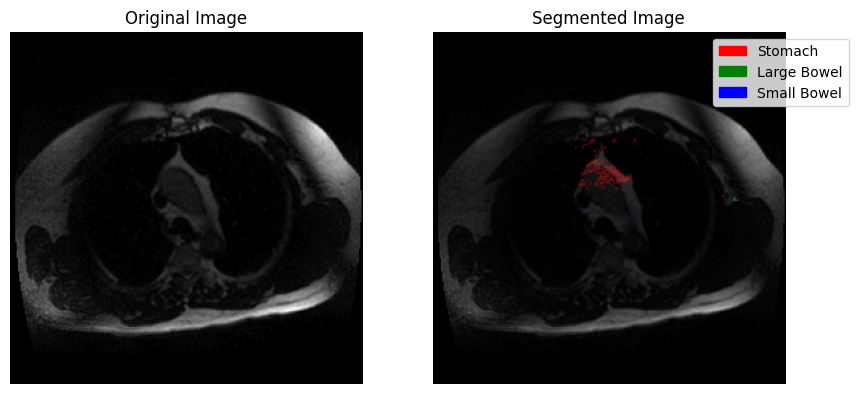

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case139/case139_day16/scans/slice_0010_266_266_1.50_1.50.png...


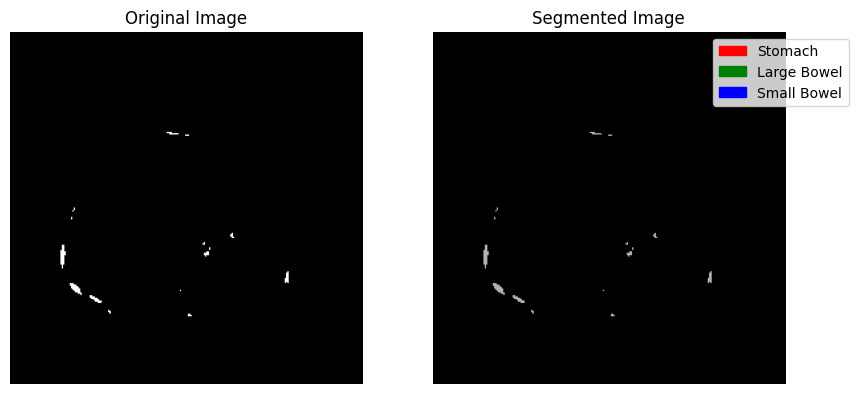

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case142/case142_day14/scans/slice_0010_266_266_1.50_1.50.png...


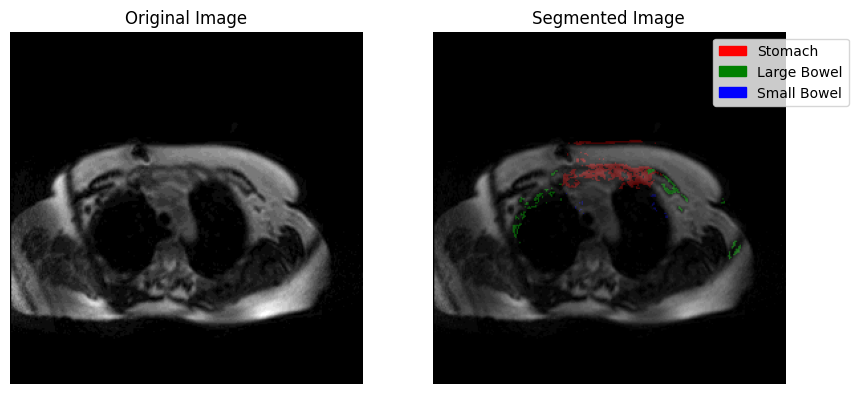

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case133/case133_day25/scans/slice_0060_360_310_1.50_1.50.png...


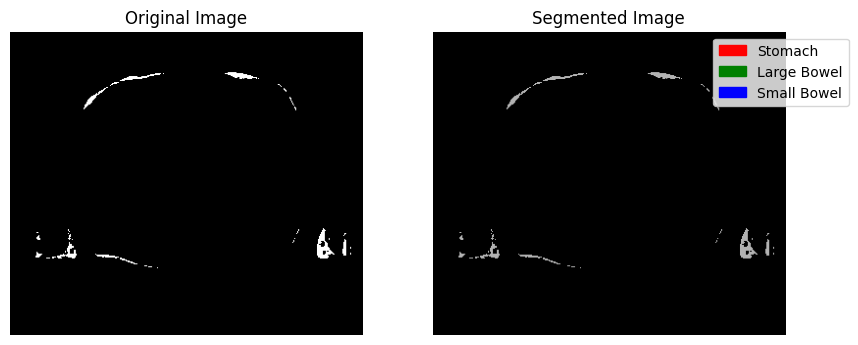

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case63/case63_day26/scans/slice_0021_266_266_1.50_1.50.png...


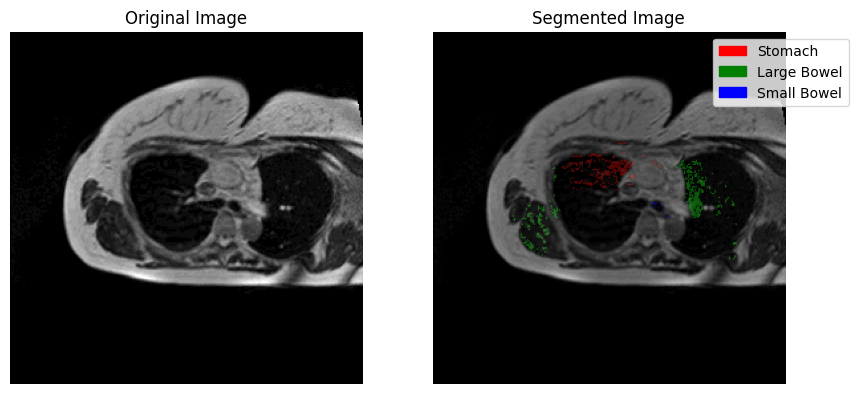

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case130/case130_day0/scans/slice_0084_266_266_1.50_1.50.png...


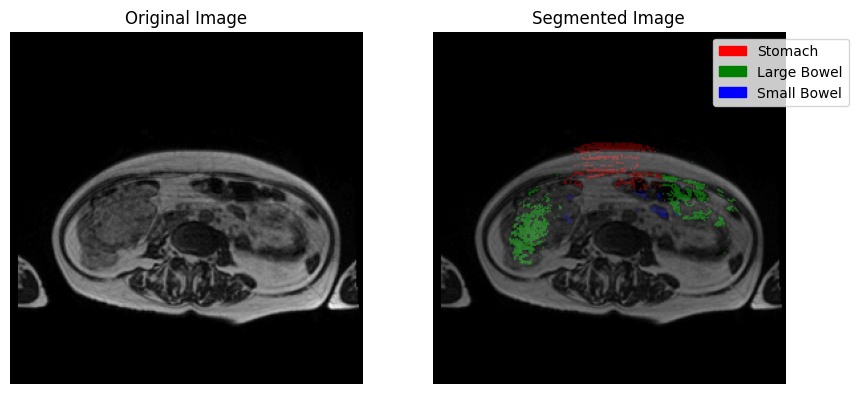

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case118/case118_day16/scans/slice_0097_266_266_1.50_1.50.png...


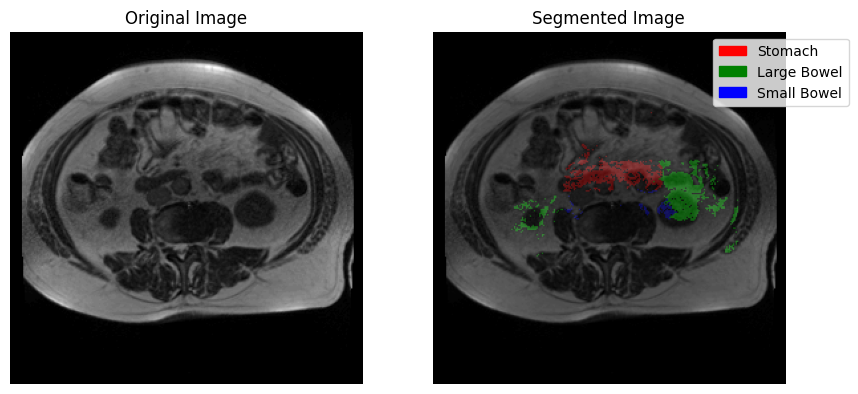

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case66/case66_day0/scans/slice_0023_266_266_1.50_1.50.png...


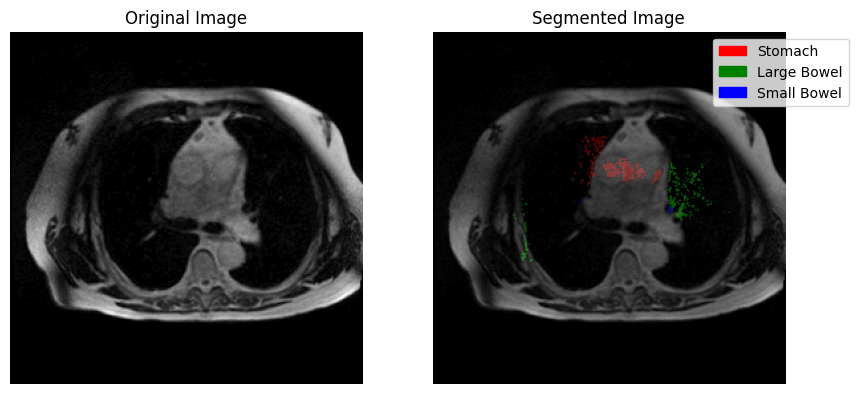

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case123/case123_day22/scans/slice_0121_266_266_1.50_1.50.png...


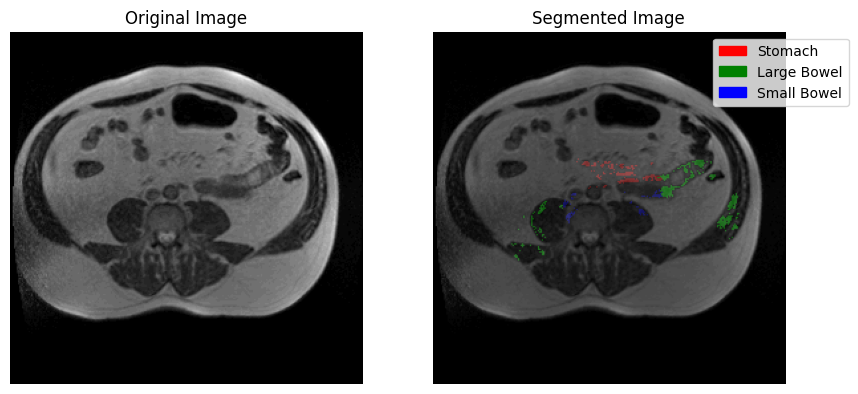

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case145/case145_day20/scans/slice_0039_360_310_1.50_1.50.png...


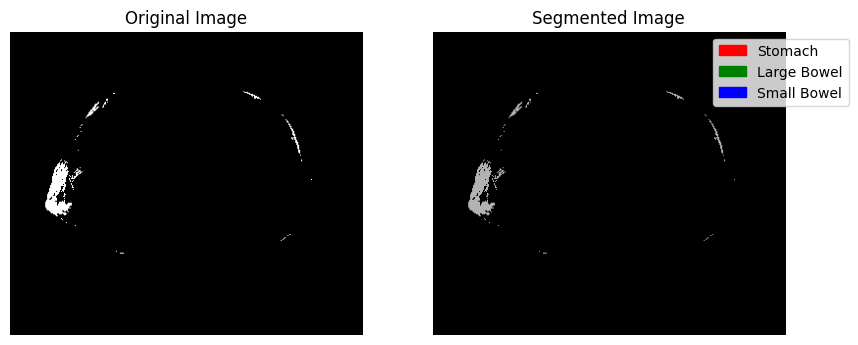

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case58/case58_day0/scans/slice_0078_266_266_1.50_1.50.png...


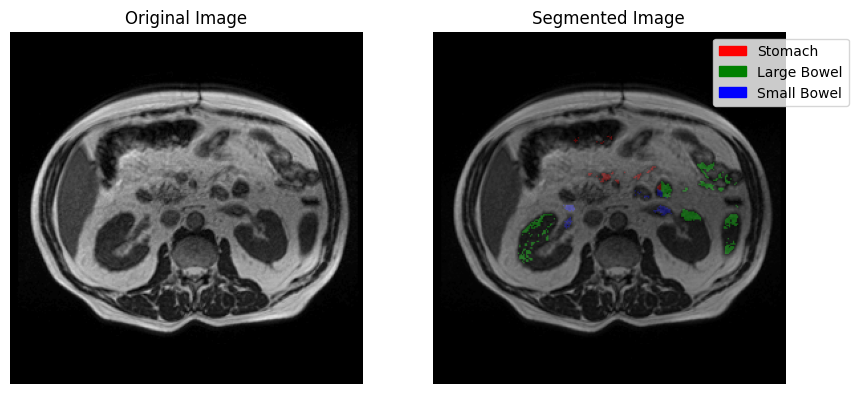

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case66/case66_day0/scans/slice_0057_266_266_1.50_1.50.png...


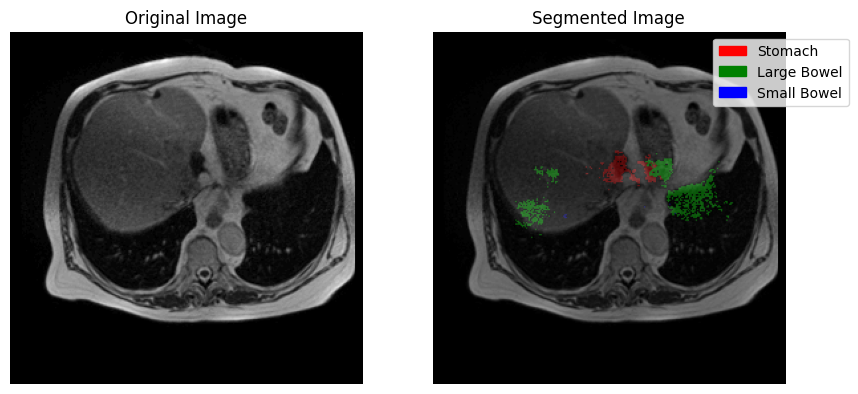

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case142/case142_day0/scans/slice_0142_266_266_1.50_1.50.png...


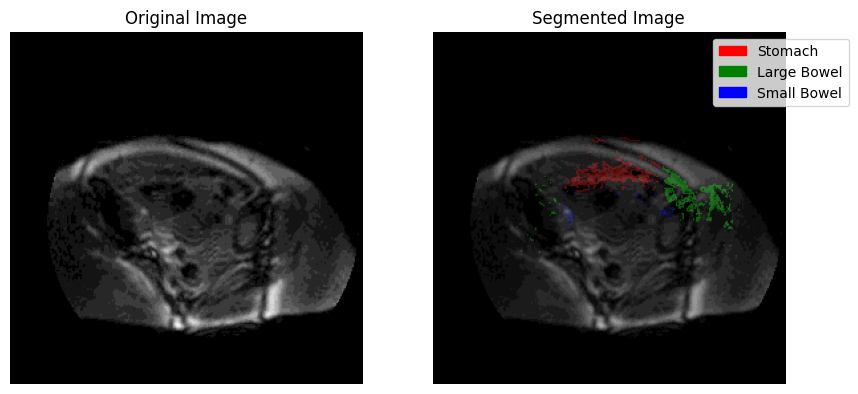

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case139/case139_day0/scans/slice_0115_234_234_1.50_1.50.png...


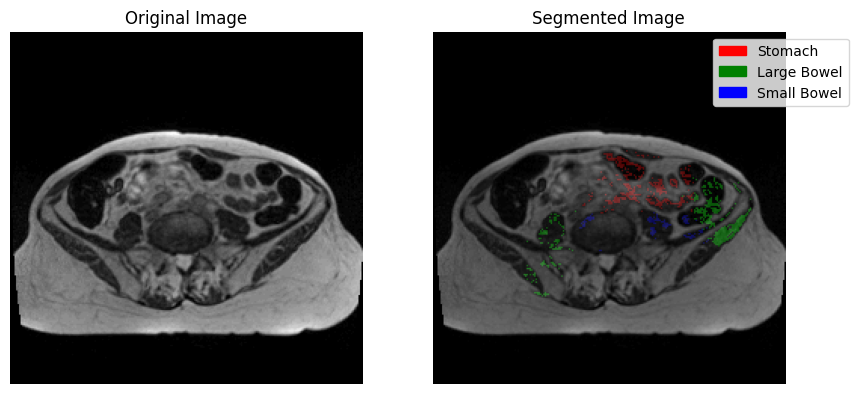

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case65/case65_day0/scans/slice_0033_266_266_1.50_1.50.png...


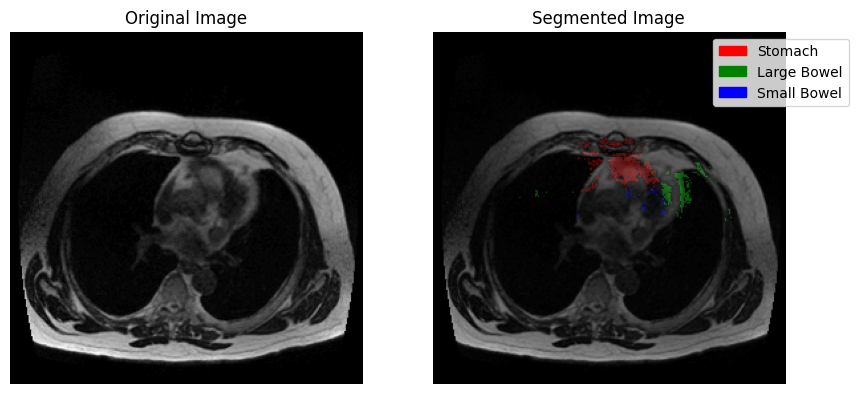

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case88/case88_day36/scans/slice_0023_360_310_1.50_1.50.png...


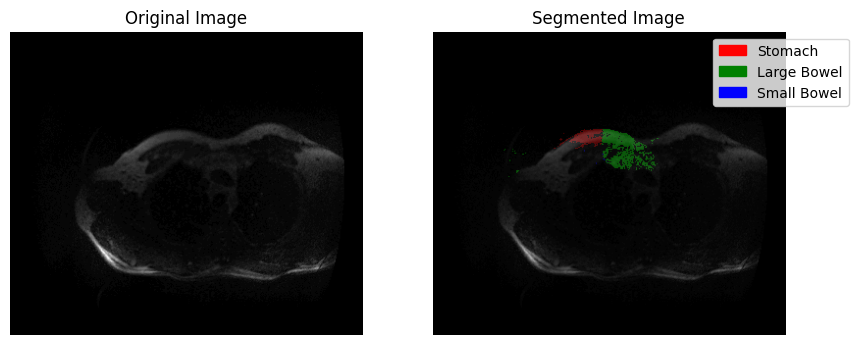

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case44/case44_day0/scans/slice_0010_266_266_1.50_1.50.png...


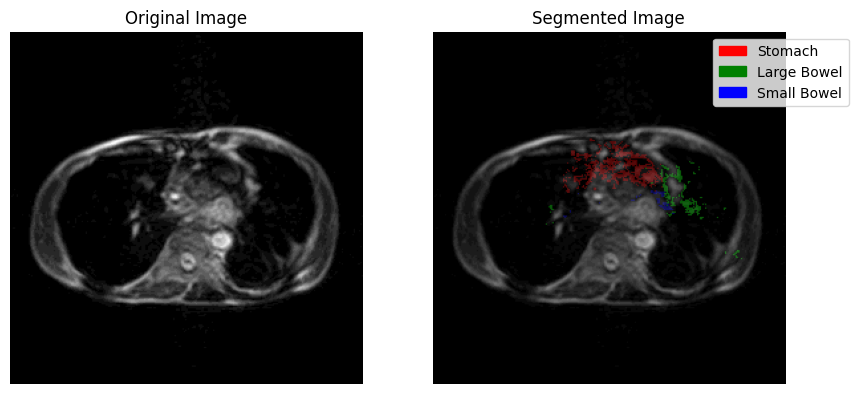

Predicting segmentation for /Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/case88/case88_day0/scans/slice_0001_360_310_1.50_1.50.png...


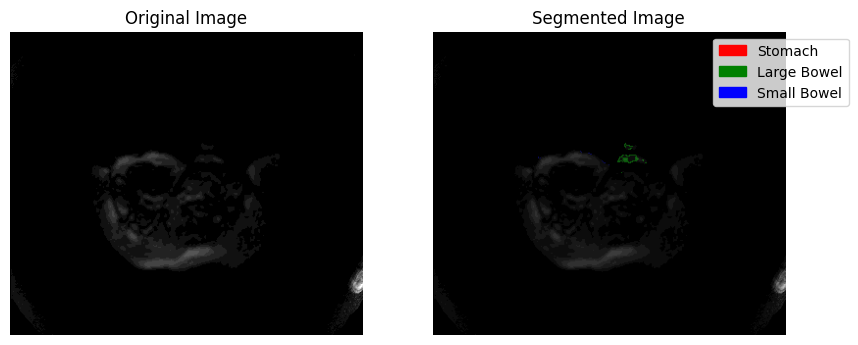

Segmentation visualization for test images completed


In [58]:
# Predict and display segmentation for test images

test_indices = np.random.choice(len(features_test), size=100, replace=False)
count = 0
for index in test_indices:
    row = df.iloc[index]
    image_relative_path = os.path.relpath(row['image_path'], '/kaggle/input/uw-madison-gi-tract-image-segmentation/train')
    image_path = os.path.join(images_base_dir, image_relative_path)
    if os.path.exists(image_path):
        predict_and_display(image_path, count, display=True)
        count += 1

print("Segmentation visualization for test images completed")